In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import flopy
from flopy.utils import Raster
import rasterio
import subprocess
import shutil
import shapefile
import random

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import seaborn as sns
from matplotlib.colors import TwoSlopeNorm
import matplotlib.cm as cm

In [3]:
ml_ws = os.path.join('..', '2023_02_05_ies')
pest_ws = os.path.join(ml_ws, 'pest')
postproc_ws = os.path.join(ml_ws, 'runmodel', 'postproc')
preproc_ws = os.path.join(ml_ws, 'runmodel', 'preproc')
shp_pth = os.path.join('..', 'data', 'raw_data', 'shapefiles')
raster_pth = os.path.join('..', 'data', 'raw_data', 'rasters')
chemdata_ws = os.path.join('..', 'data', 'raw_data', 'chem')

In [4]:
phi = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.phi.actual.csv'),index_col=0)
phi.index = phi.total_runs

In [5]:
phi.iloc[:,6:]

,1,2,3,4,5,6,7,8,9,10,...,490,491,492,493,494,495,496,497,498,base
total_runs,,,,,,,,,,,,,,,,,,,,,
489,55064.40,NaN,22629.40,37505.50,21609.40,19838.60,10282.40,16451.20,47192.00,32015.50,...,NaN,12217.00,16951.40,16692.30,14497.20,33124.40,13109.50,15165.10,7539.05,1918.71
1105,3736.17,NaN,4050.94,2821.79,3746.30,3714.73,3962.65,3021.34,3622.36,3345.04,...,NaN,3527.53,3822.19,3224.91,4499.50,3265.18,2969.19,5326.70,3296.79,2089.75
1719,2314.22,NaN,2074.90,2085.18,2194.94,2082.01,2146.06,2032.22,2095.31,2356.52,...,NaN,2155.21,2141.26,2096.49,2083.73,2115.62,2202.15,2302.91,2095.39,2049.36
2333,2046.58,NaN,1912.60,1970.25,1959.68,1991.61,1948.48,1946.20,1986.41,1987.57,...,NaN,1943.54,1954.65,1939.82,1957.54,1950.20,1998.11,1998.49,1955.68,1892.92
2947,1932.40,NaN,1878.08,1921.59,1917.67,1917.84,1912.99,1910.94,1946.54,1917.21,...,NaN,1907.76,1917.95,1924.67,1914.01,1902.70,1916.76,1924.52,1915.20,1853.87
3561,1910.17,NaN,1861.51,1882.96,1899.65,1899.87,1881.42,1874.28,1909.83,1935.50,...,NaN,1892.86,1913.89,1875.15,1897.75,1880.24,1905.24,1885.81,1896.83,1847.78


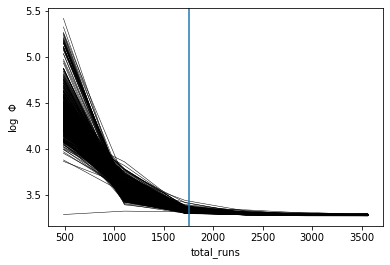

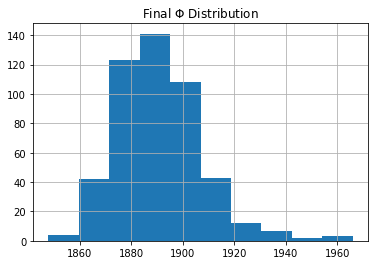

In [6]:
phi.iloc[:,6:].apply(np.log10).plot(legend=False,lw=0.5,color='k')
plt.ylabel('log  $\Phi$ ')
plt.axvline(x=1753, label='iteration 3')
plt.figure()
phi.iloc[-1,6:].hist()
plt.title('Final $\Phi$ Distribution');

In [7]:
phi

,total_runs,mean,standard_deviation,min,max,0,1,2,3,4,...,490,491,492,493,494,495,496,497,498,base
total_runs,,,,,,,,,,,,,,,,,,,,,
489,489,33342.40,33751.9000,1918.71,263538.00,156971.00,55064.40,NaN,22629.40,37505.50,...,NaN,12217.00,16951.40,16692.30,14497.20,33124.40,13109.50,15165.10,7539.05,1918.71
1105,1105,3733.02,765.1350,2089.75,7198.11,3337.20,3736.17,NaN,4050.94,2821.79,...,NaN,3527.53,3822.19,3224.91,4499.50,3265.18,2969.19,5326.70,3296.79,2089.75
1719,1719,2119.51,97.5778,1963.05,2729.59,2036.12,2314.22,NaN,2074.90,2085.18,...,NaN,2155.21,2141.26,2096.49,2083.73,2115.62,2202.15,2302.91,2095.39,2049.36
2333,2333,1953.95,33.8883,1892.92,2155.05,1904.44,2046.58,NaN,1912.60,1970.25,...,NaN,1943.54,1954.65,1939.82,1957.54,1950.20,1998.11,1998.49,1955.68,1892.92
2947,2947,1908.07,19.2840,1853.87,2031.37,1878.24,1932.40,NaN,1878.08,1921.59,...,NaN,1907.76,1917.95,1924.67,1914.01,1902.70,1916.76,1924.52,1915.20,1853.87
3561,3561,1890.74,16.5050,1847.78,1966.04,1883.99,1910.17,NaN,1861.51,1882.96,...,NaN,1892.86,1913.89,1875.15,1897.75,1880.24,1905.24,1885.81,1896.83,1847.78


In [8]:
phi.iloc[:,6:]

,1,2,3,4,5,6,7,8,9,10,...,490,491,492,493,494,495,496,497,498,base
total_runs,,,,,,,,,,,,,,,,,,,,,
489,55064.40,NaN,22629.40,37505.50,21609.40,19838.60,10282.40,16451.20,47192.00,32015.50,...,NaN,12217.00,16951.40,16692.30,14497.20,33124.40,13109.50,15165.10,7539.05,1918.71
1105,3736.17,NaN,4050.94,2821.79,3746.30,3714.73,3962.65,3021.34,3622.36,3345.04,...,NaN,3527.53,3822.19,3224.91,4499.50,3265.18,2969.19,5326.70,3296.79,2089.75
1719,2314.22,NaN,2074.90,2085.18,2194.94,2082.01,2146.06,2032.22,2095.31,2356.52,...,NaN,2155.21,2141.26,2096.49,2083.73,2115.62,2202.15,2302.91,2095.39,2049.36
2333,2046.58,NaN,1912.60,1970.25,1959.68,1991.61,1948.48,1946.20,1986.41,1987.57,...,NaN,1943.54,1954.65,1939.82,1957.54,1950.20,1998.11,1998.49,1955.68,1892.92
2947,1932.40,NaN,1878.08,1921.59,1917.67,1917.84,1912.99,1910.94,1946.54,1917.21,...,NaN,1907.76,1917.95,1924.67,1914.01,1902.70,1916.76,1924.52,1915.20,1853.87
3561,1910.17,NaN,1861.51,1882.96,1899.65,1899.87,1881.42,1874.28,1909.83,1935.50,...,NaN,1892.86,1913.89,1875.15,1897.75,1880.24,1905.24,1885.81,1896.83,1847.78


### Sanity check
Ensure that no prior-data conflicts are occurring and that inequality observations are respected.

In [9]:
pdc = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.pdc.csv'))

In [11]:
pdc.describe() # pdcs only pertain to inequality obs

,obs_mean,obs_std,obs_min,obs_max,obs_stat_min,obs_stat_max,sim_mean,sim_std,sim_min,sim_max,sim_stat_min,sim_stat_max,distance
count,917.0,917.0,917.0,917.0,917.0,917.0,917.000000,917.000000,917.000000,9.170000e+02,917.000000,917.000000,9.170000e+02
mean,0.0,0.0,0.0,0.0,0.0,0.0,-39901.398321,25858.674875,-89540.612323,-8.290053e+02,-14042.723433,-65760.072955,8.290053e+02
std,0.0,0.0,0.0,0.0,0.0,0.0,13252.978359,3654.960166,1238.019975,1.276794e+03,10690.335889,16239.364186,1.276794e+03
min,0.0,0.0,0.0,0.0,0.0,0.0,-68042.900000,8048.310000,-92315.000000,-6.150360e+03,-42375.900000,-93709.800000,2.639640e-08
25%,0.0,0.0,0.0,0.0,0.0,0.0,-50458.400000,24855.500000,-90048.600000,-1.587590e+03,-22365.200000,-78797.200000,2.455560e-03
50%,0.0,0.0,0.0,0.0,0.0,0.0,-40896.100000,27421.300000,-89887.000000,-4.079200e+00,-12961.600000,-68795.000000,4.079200e+00
75%,0.0,0.0,0.0,0.0,0.0,0.0,-29231.000000,28110.600000,-89414.300000,-2.455560e-03,-5150.670000,-53561.900000,1.587590e+03
max,0.0,0.0,0.0,0.0,0.0,0.0,-6790.990000,29272.600000,-71416.500000,-2.639640e-08,4830.860000,-14893.000000,6.150360e+03


## Read observation ensembles

### Convert from binary to csv

In [12]:
iteration_obs = [0, 1, 2, 3, 4, 5]

In [13]:
for i in iteration_obs:
    print(f'Starting convertion of .jcb to .csv for iteration {i}')
    if not f'ies-postcalib.{i}.obs.csv' in os.listdir(pest_ws):
        p = subprocess.run(['i64jcb2csv', f'ies-postcalib.{i}.obs.jcb', f'ies-postcalib.{i}.obs.csv', 'nt'], cwd=pest_ws, stdout=subprocess.PIPE, text=True)
        for row in p.stdout.split('\n'):
            print(row)

Starting convertion of .jcb to .csv for iteration 0
Starting convertion of .jcb to .csv for iteration 1
Starting convertion of .jcb to .csv for iteration 2
Starting convertion of .jcb to .csv for iteration 3
Starting convertion of .jcb to .csv for iteration 4
Starting convertion of .jcb to .csv for iteration 5


### Prior observation ensembles

In [14]:
# prior observation ensemble
oe_pr = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.0.obs.csv'), index_col=0)

C:\Users\nat12nho\AppData\Local\Temp\ipykernel_10244\1574130942.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  oe_pr = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.0.obs.csv'), index_col=0)


In [15]:
# Extract relevant predictions into separate dataframes | OUTFLOW prior probability
outflow_df_pr = oe_pr[[i for i in oe_pr.columns if 'of-' in i]]
of_bound_pr = outflow_df_pr[[i for i in outflow_df_pr.columns if 'of-bound' in i]]
of_reach_pr = outflow_df_pr[[i for i in outflow_df_pr.columns if 'of-bound' not in i]]

of_bound_pr_nb = of_bound_pr.drop('base')
of_reach_pr_nb = of_reach_pr.drop('base')

In [16]:
# Extract relevant predictions into separate dataframes | sw-gw exchange prior probability
flux_bound_pr = oe_pr[[i for i in oe_pr.columns if 'flux-' in i]]
flux_reach_pr = oe_pr[[i for i in oe_pr.columns if 'lk-' in i]]

flux_bound_pr_nb = flux_bound_pr.drop('base')
flux_reach_pr_nb = flux_reach_pr.drop('base')

### Posterior observation ensemble

In [17]:
oe_pt = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.3.obs.csv'), index_col=0)

C:\Users\nat12nho\AppData\Local\Temp\ipykernel_10244\3092812340.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  oe_pt = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.3.obs.csv'), index_col=0)


In [18]:
# Extract relevant predictions into separate dataframes | OUTFLOW prior probability
outflow_df_pt = oe_pt[[i for i in oe_pt.columns if 'of-' in i]]
of_bound_pt = outflow_df_pt[[i for i in outflow_df_pt.columns if 'of-bound' in i]]
of_reach_pt = outflow_df_pt[[i for i in outflow_df_pt.columns if 'of-bound' not in i]]

of_bound_pt_nb = of_bound_pt.drop('base')
of_reach_pt_nb = of_reach_pt.drop('base')

In [19]:
# Extract relevant predictions into separate dataframes | sw-gw exchange prior probability
flux_bound_pt = oe_pt[[i for i in oe_pt.columns if 'flux-' in i]]
flux_reach_pt = oe_pt[[i for i in oe_pt.columns if 'lk-' in i]]

flux_bound_pt_nb = flux_bound_pt.drop('base')
flux_reach_pt_nb = flux_reach_pt.drop('base')

In [20]:
# Reifile
reifile = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.3.base.rei'), skiprows=1, delim_whitespace=True)
reifile_uncal = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.0.base.rei'), skiprows=1, delim_whitespace=True)

In [21]:
reifile.head()

,Name,Group,Measured,Modelled,Residual,Weight
0,b10-1_1,heads,133.695,133.417086,0.277914,0.897773
1,b10-1_2,heads,133.620,133.305539,0.314461,0.897773
2,b10-1_3,heads,133.480,133.324691,0.155309,0.897773
3,b10-1_4,heads,133.425,133.312953,0.112047,0.897773
4,b14-1_1,heads,140.200,140.072934,0.127066,0.897773


In [22]:
reifile_uncal.head()

,Name,Group,Measured,Modelled,Residual,Weight
0,b10-1_1,heads,133.695,133.444398,0.250602,0.897773
1,b10-1_2,heads,133.620,133.354599,0.265401,0.897773
2,b10-1_3,heads,133.480,133.370594,0.109406,0.897773
3,b10-1_4,heads,133.425,133.370582,0.054418,0.897773
4,b14-1_1,heads,140.200,139.998189,0.201811,0.897773


In [23]:
#mf6headobs = pd.read_csv(os.path.join(ml_ws, 'runmodel', 'model', 'head.obs.csv'))

In [24]:
#sp_start = pd.to_datetime('2015-11-30') + pd.to_timedelta(mf6headobs.time.values,unit='d')

In [25]:
results_ws = os.path.join(ml_ws, 'results')
if not os.path.exists(results_ws):
    os.mkdir(results_ws)

### Visualize reaches flux

In [30]:
ml_boundary = shapefile.Reader(os.path.join(shp_pth, 'model_boundary.shp')) # Model boundary shapefile
mlb_shape = np.array(np.rint(ml_boundary.shapeRecords()[0].shape.points)) # Model boundary array
orbacken = shapefile.Reader(os.path.join(shp_pth, 'orbacken_sfr.shp')) # Creek Örbäcken shapefile
orbacken_shp = np.concatenate([np.rint(i.shape.points) for i in orbacken.shapeRecords()]) # Creek Örbäcken array
ortophoto = rasterio.open(os.path.join(raster_pth, 'ortophoto.tif'))

In [31]:
bins_pth = os.path.join('..', 'bins')
ml_name = 'hagfors_1'
sim = flopy.mf6.MFSimulation.load(
    ml_name,
    'mf6',
    os.path.join(bins_pth, 'mf6'),
    os.path.join(ml_ws, 'runmodel', 'model')
)

loading simulation...
  loading simulation name file...
  loading tdis package...
  loading model gwf6...
    loading package disv...
    loading package ghb...
    loading package obs...
    loading package sfr...
    loading package ic...
    loading package npf...
    loading package sto...
    loading package rch...
    loading package oc...
  loading ims package hagfors_1...


In [32]:
gwf = sim.get_model(ml_name)

In [33]:
disv = gwf.get_package('disv')
sfr = gwf.get_package('sfr')

In [34]:
flux_reach_pr_nb = flux_reach_pr.drop('base')
flux_reach_pt_nb = flux_reach_pt.drop('base')

In [35]:
flux_reach_pr_full_sim = {}
flux_reach_pt_full_sim = {}

In [36]:
for i in range(1, 264): # Loop over each reach
    for j in range(1,214): # Loop over each timestep
        data = flux_reach_pr_nb[f'lk-{i}_{j}'].values
        try:
            flux_reach_pr_full_sim[f'lk-{i}'] = np.concatenate((flux_reach_pr_full_sim[f'lk-{i}'], data), 0)
        except KeyError:
            flux_reach_pr_full_sim[f'lk-{i}'] = data

In [37]:
for i in range(1, 264): # Loop over each reach
    for j in range(1,214): # Loop over each timestep
        data = flux_reach_pt_nb[f'lk-{i}_{j}'].values
        try:
            flux_reach_pt_full_sim[f'lk-{i}'] = np.concatenate((flux_reach_pt_full_sim[f'lk-{i}'], data), 0)
        except KeyError:
            flux_reach_pt_full_sim[f'lk-{i}'] = data

In [38]:
flux_reach_pr_full_sim_df = pd.DataFrame(flux_reach_pr_full_sim)
flux_reach_pt_full_sim_df = pd.DataFrame(flux_reach_pt_full_sim)

In [39]:
flux_reach_pr_full_sim_df_stats = flux_reach_pr_full_sim_df.describe().T
flux_reach_pt_full_sim_df_stats = flux_reach_pt_full_sim_df.describe().T

In [40]:
def plot_reaches():
    # Data
    x = [i for i in range(1, 264)]
    y_min_pr = flux_reach_pr_full_sim_df_stats['min'].values
    y_max_pr = flux_reach_pr_full_sim_df_stats['max'].values
    
    y_min_pt = flux_reach_pt_full_sim_df_stats['min'].values
    y_max_pt = flux_reach_pt_full_sim_df_stats['max'].values
    
    # Figure settings
    plt.figure(figsize=(10, 3), dpi=1200)
    
    plt.fill_between(x, y_min_pr, y_max_pr, color='grey', alpha=0.35, label='Prior probability', lw=0)
    plt.fill_between(x, y_min_pt, y_max_pt, color='blue', alpha=0.50, label='Posterior probability', lw=0)
    plt.axhline(y=0, c='k', linestyle='--', linewidth=1, alpha=0.5)
    
    # Reaches
    plt.axvline(x=31, c='k', linestyle='--', lw=1, alpha=0.5) # reach 1
    plt.axvline(x=47, c='k', linestyle='--', lw=1, alpha=0.5) # reach 2
    plt.axvline(x=71, c='k', linestyle='--', lw=1, alpha=0.5) # reach 3
    plt.axvline(x=91, c='k', linestyle='--', lw=1, alpha=0.5) # reach 4
    plt.axvline(x=121, c='k', linestyle='--', lw=1, alpha=0.5) # reach 5
    plt.axvline(x=138, c='k', linestyle='--', lw=1, alpha=0.5) # reach 6
    plt.axvline(x=151, c='k', linestyle='--', lw=1, alpha=0.5) # reach 7
    plt.axvline(x=155, c='k', linestyle='--', lw=1, alpha=0.5) # reach 8
    plt.axvline(x=161, c='k', linestyle='--', lw=1, alpha=0.5) # reach 9
    plt.axvline(x=186, c='k', linestyle='--', lw=1, alpha=0.5) # reach 10
    plt.axvline(x=226, c='k', linestyle='--', lw=1, alpha=0.5) # reach 11
    
    plt.xlim((0, 264))
    plt.ylim((-2000, 3500))
    plt.ylabel('Flux ($m^3$/d)', fontsize=16, fontname='Calibri')
    
    # reach text
    plt.text(15, -1800, 'r1', fontsize=12)
    plt.text(38, -1800, 'r2', fontsize=12)
    plt.text(58, -1800, 'r3', fontsize=12)
    plt.text(79, -1800, 'r4', fontsize=12)
    plt.text(105, -1800, 'r5', fontsize=12)
    plt.text(128, -1800, 'r6', fontsize=12)
    plt.text(143, -1800, 'r7', fontsize=12)
    plt.text(151.6, -1800, 'r8', fontsize=9, rotation=90)
    plt.text(156.2, -1800, 'r9', fontsize=11, rotation=90)
    plt.text(169, -1800, 'r10', fontsize=12)
    plt.text(202, -1800, 'r11', fontsize=12)
    plt.text(242, -1800, 'r12', fontsize=12)
    
    # Recharge, Discharge text
    plt.text(267, 500, 'Recharge', fontsize=16, fontname='Calibri', rotation=90)
    plt.text(267, -1800, 'Discharge', fontsize=16, fontname='Calibri', rotation=90)
    
    plt.yticks(fontsize=14, fontname='Calibri')
    
    plt.legend(prop={'size': 16, 'family': 'Calibri'})
    plt.tight_layout()
    
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.savefig(os.path.join(results_ws, 'reaches_flux.png'))

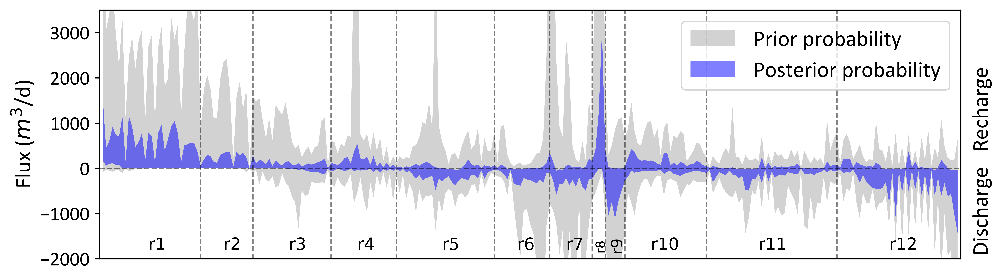

In [41]:
plot_reaches()

In [42]:
sfr_pgd_df = pd.DataFrame(sfr.packagedata.array)
sfr_pgd_df

,rno,cellid,rlen,rwid,rgrd,rtp,rbth,rhk,man,ncon,ustrf,ndv,boundname
0,0,"(0, 2645)",5.88,2.0,0.004000,143.66,2.122000,86.400000,2.500000000e-02,1,1.0,0,bound1
1,1,"(0, 2643)",1.85,2.0,0.004491,143.53,2.179644,86.399989,2.500000275e-02,2,1.0,0,bound1
2,2,"(0, 2641)",3.56,2.0,0.005043,143.53,2.238863,86.400012,2.499999725e-02,2,1.0,0,bound1
3,3,"(0, 2640)",5.53,2.0,0.005662,143.49,2.299716,86.400012,2.499999725e-02,2,1.0,0,bound1
4,4,"(0, 2637)",2.84,2.0,0.006357,143.49,2.362143,86.400000,2.500000000e-02,2,1.0,0,bound1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,258,"(0, 32)",2.07,2.0,0.008999,133.51,1.280993,86.399992,2.500000201e-02,2,1.0,0,bound14
259,259,"(0, 30)",4.10,2.0,0.006839,133.51,1.263919,86.399954,2.500001099e-02,2,1.0,0,bound14
260,260,"(0, 27)",3.67,2.0,0.005196,133.51,1.247043,86.400000,2.500000000e-02,2,1.0,0,bound14
261,261,"(0, 5)",3.41,2.0,0.003949,133.51,1.230422,86.400012,2.499999725e-02,2,1.0,0,bound14


In [43]:
np.arange(0,91)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90])

In [44]:
# select bounds 1 to 4 ("reaches" 1 to 4 in the paper) to calculate mean recharge
bnd1_4 = np.arange(0,91)
bnd5_7 = np.arange(91,151)
bnd8_9 = np.arange(151,161)
bnd10 = np.arange(161,186)
bnd11_12 = np.arange(186,263)

In [45]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df = frptfs_df.iloc[bnd1_4]
frptfs_df

,0,1,2,3,4,5,6,7,8,9,...,103295,103296,103297,103298,103299,103300,103301,103302,103303,103304
0,1107.524000,506.868100,405.712100,540.687200,335.968300,393.371200,515.842500,946.076900,629.507600,443.059000,...,227.354800,517.786600,553.271400,590.057300,408.736600,309.506800,482.467700,412.177500,500.843900,418.391900
1,324.129000,132.602600,124.441400,186.919900,115.816800,138.990600,159.659000,250.718800,206.302400,137.542800,...,81.981170,154.215800,204.523300,175.652300,123.713700,102.791800,140.650400,136.318800,147.035700,142.506800
2,455.467300,204.166400,207.706000,345.269900,195.230400,237.643200,260.472900,371.891900,296.208500,209.557000,...,141.934700,223.908900,276.451900,252.559200,188.504700,169.268000,221.382600,237.106600,227.450900,192.993100
3,557.809300,234.542600,268.740000,476.529700,285.810200,356.283800,334.352400,460.719800,342.834900,262.080700,...,215.534000,289.360500,322.365700,324.187300,253.523100,237.572200,296.211400,322.346100,303.877000,230.965100
4,302.494500,133.635200,149.610500,287.025500,161.270200,211.476500,209.003700,225.114300,201.829600,143.627700,...,140.261800,154.257600,229.208300,190.795300,133.719500,129.069500,156.641400,169.145300,170.801200,157.768400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,1.043965,0.796572,2.357514,18.226630,5.614713,4.168063,4.152936,-0.679263,4.588733,3.231172,...,2.418234,8.472748,2.255440,2.368452,0.409045,4.118021,1.891040,3.422558,4.573437,2.809648
87,3.867613,2.983089,7.458741,76.713450,19.787460,10.295390,10.081010,-5.230454,-6.641687,9.898256,...,6.503808,28.549330,3.387573,4.851845,1.403416,15.567190,1.297640,10.425220,6.031401,10.020700
88,0.780365,0.588321,1.325320,17.594040,3.838685,2.056240,2.758037,-1.025286,-2.571827,1.306609,...,1.186461,6.759252,-0.011926,0.213652,0.891368,2.981395,0.127858,1.631442,2.682213,2.064946
89,4.001997,1.384563,4.845228,37.755780,9.814011,3.481719,2.362420,-5.980497,-30.802370,-0.479508,...,4.203964,19.640380,-5.799116,-4.530944,0.629614,11.250440,-2.997426,5.828878,-2.408878,6.200622


In [46]:
frptfs_df.T.mean().sum() # Total recharge reaches 1 - 4 (centered at posterior mean)

7204.805191826363

In [47]:
frptfs_df.T.std().sum() # Standard deviation total recharge reaches 1 - 4

3070.1089908133476

In [48]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df = frptfs_df.iloc[bnd5_7]
frptfs_df.T.mean().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

-3102.864282131764

In [49]:
frptfs_df.T.std().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

1679.7515052988215

In [50]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df = frptfs_df.iloc[bnd8_9]
frptfs_df.T.mean().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

-224.5007957037376

In [51]:
frptfs_df.T.std().sum()

608.7272176032566

In [52]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df = frptfs_df.iloc[bnd10]
frptfs_df.T.mean().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

4.8856522481101194

In [53]:
frptfs_df.T.std().sum()

427.2694385512174

In [54]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df = frptfs_df.iloc[bnd11_12]
frptfs_df.T.mean().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

-5328.630792438167

In [55]:
frptfs_df.T.std().sum()

2574.8612343001096

In [56]:
frptfs_df = flux_reach_pt_full_sim_df.T.reset_index(drop=True)
frptfs_df.T.mean().sum() # Total discharge reaches 5 - 7 (centered at posterior mean), multiply by -1 to get positive

-1446.3050261991957

In [57]:
frptfs_df.T.std().sum()

8360.718386566754

In [58]:
frptfs_df

,0,1,2,3,4,5,6,7,8,9,...,103295,103296,103297,103298,103299,103300,103301,103302,103303,103304
0,1107.5240,506.8681,405.71210,540.68720,335.9683,393.3712,515.84250,946.07690,629.50760,443.0590,...,227.35480,517.7866,553.2714,590.05730,408.73660,309.5068,482.46770,412.17750,500.8439,418.39190
1,324.1290,132.6026,124.44140,186.91990,115.8168,138.9906,159.65900,250.71880,206.30240,137.5428,...,81.98117,154.2158,204.5233,175.65230,123.71370,102.7918,140.65040,136.31880,147.0357,142.50680
2,455.4673,204.1664,207.70600,345.26990,195.2304,237.6432,260.47290,371.89190,296.20850,209.5570,...,141.93470,223.9089,276.4519,252.55920,188.50470,169.2680,221.38260,237.10660,227.4509,192.99310
3,557.8093,234.5426,268.74000,476.52970,285.8102,356.2838,334.35240,460.71980,342.83490,262.0807,...,215.53400,289.3605,322.3657,324.18730,253.52310,237.5722,296.21140,322.34610,303.8770,230.96510
4,302.4945,133.6352,149.61050,287.02550,161.2702,211.4765,209.00370,225.11430,201.82960,143.6277,...,140.26180,154.2576,229.2083,190.79530,133.71950,129.0695,156.64140,169.14530,170.8012,157.76840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,-166.6743,-246.8913,-77.08681,-71.68380,-103.4199,-121.4078,-90.34384,-53.98609,-64.27773,-148.6250,...,-116.89920,-153.3078,-113.0969,-45.75362,-92.97125,-106.8903,-70.30154,-25.79748,-141.9638,-57.11993
259,-227.3616,-372.0726,-150.47830,-86.99326,-204.1338,-208.5001,-206.85690,-138.97760,-122.12290,-239.5620,...,-247.41680,-194.2902,-218.6625,-101.70840,-203.27220,-244.3729,-105.24070,-75.97264,-254.2574,-108.46040
260,-274.9713,-328.3505,-144.69850,-90.98393,-228.9379,-230.5988,-182.39090,-161.90360,-114.07600,-201.4598,...,-243.05730,-218.7239,-228.8165,-87.53323,-183.28700,-224.8454,-82.84183,-94.79642,-256.1021,-86.83775
261,-515.6585,-322.1577,-155.42290,-135.48890,-245.4811,-363.3502,-440.66840,-203.64140,-137.18850,-178.6663,...,-322.80360,-178.1508,-253.1204,-133.28260,-217.72870,-345.1439,-199.85390,-155.97010,-385.5352,-81.35653


In [59]:
frptfs_df.iloc[151:161]

,0,1,2,3,4,5,6,7,8,9,...,103295,103296,103297,103298,103299,103300,103301,103302,103303,103304
151,-14.416710,-9.603354,-31.48107,-33.632470,-19.84698,-32.735290,-22.163970,-19.435210,-23.52488,-27.95474,...,-15.801270,19.099550,36.24355,-7.285592,8.17259,-20.431290,49.26494,4.543537,15.92979,-14.079590
152,43.943550,33.340630,22.26495,44.534480,57.54365,29.889510,23.006720,20.914100,29.11676,76.34530,...,71.658610,129.419900,239.32800,283.352200,107.81330,163.224300,175.47890,176.405800,174.70950,97.754940
153,52.383240,46.676900,39.41707,75.282880,77.00359,45.683830,25.354810,27.039980,38.37513,85.47810,...,71.727300,61.941780,239.80270,292.111900,134.77410,227.083500,172.36400,183.514900,138.32760,93.794450
154,6.787018,4.075743,-3.59296,-9.247254,15.05597,-2.835865,-8.374815,-6.589287,-13.18055,-26.45654,...,-1.171372,-6.521698,34.18877,-34.292610,39.58168,-7.357811,28.36784,33.907840,18.76993,-0.010551
155,-35.870510,-22.989710,-65.41522,-57.370910,-62.93954,-45.580970,-31.898960,-35.204160,-41.20622,-111.56680,...,-24.969680,-22.183190,-118.88970,-141.821000,-89.20381,-77.182820,-92.24181,-64.697700,-55.75687,-43.887820
156,-46.712770,-18.706300,-54.37764,-55.906930,-42.81750,-50.742050,-21.829620,-37.322070,-41.86131,-81.66005,...,-34.736240,-22.349710,-109.15140,-106.714400,-119.25200,-55.286200,-91.62910,-65.271030,-57.97895,-54.235940
157,-104.180300,-55.310630,-103.52100,-103.552300,-92.77849,-83.254660,-38.318320,-53.780090,-46.72245,-99.75056,...,-85.815530,-54.667390,-175.63370,-205.512800,-251.80940,-91.098660,-158.68290,-173.774300,-141.70990,-132.193400
158,-140.050300,-73.646780,-100.47020,-109.181100,-138.64440,-88.514140,-60.116570,-42.930700,-31.03254,-72.78287,...,-96.338130,-71.681110,-222.06850,-183.330500,-161.12830,-138.033400,-155.52010,-182.652200,-142.80980,-132.678100
159,-110.126800,-81.677000,-103.41590,-87.294940,-152.41460,-105.550800,-81.212240,-42.952690,-33.49371,-66.56680,...,-78.704790,-52.558690,-183.02360,-121.796700,-89.05589,-137.455700,-145.95710,-119.402500,-112.43710,-95.868690
160,-55.687530,-69.670480,-75.35608,-44.810920,-71.88134,-65.392870,-68.894280,-27.737310,-23.67913,-29.84016,...,-42.962320,-19.675830,-87.32715,-43.578530,-47.64485,-68.119090,-132.29790,-65.391270,-64.01679,-37.211110


In [60]:
sfr_pgd_df

,rno,cellid,rlen,rwid,rgrd,rtp,rbth,rhk,man,ncon,ustrf,ndv,boundname
0,0,"(0, 2645)",5.88,2.0,0.004000,143.66,2.122000,86.400000,2.500000000e-02,1,1.0,0,bound1
1,1,"(0, 2643)",1.85,2.0,0.004491,143.53,2.179644,86.399989,2.500000275e-02,2,1.0,0,bound1
2,2,"(0, 2641)",3.56,2.0,0.005043,143.53,2.238863,86.400012,2.499999725e-02,2,1.0,0,bound1
3,3,"(0, 2640)",5.53,2.0,0.005662,143.49,2.299716,86.400012,2.499999725e-02,2,1.0,0,bound1
4,4,"(0, 2637)",2.84,2.0,0.006357,143.49,2.362143,86.400000,2.500000000e-02,2,1.0,0,bound1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,258,"(0, 32)",2.07,2.0,0.008999,133.51,1.280993,86.399992,2.500000201e-02,2,1.0,0,bound14
259,259,"(0, 30)",4.10,2.0,0.006839,133.51,1.263919,86.399954,2.500001099e-02,2,1.0,0,bound14
260,260,"(0, 27)",3.67,2.0,0.005196,133.51,1.247043,86.400000,2.500000000e-02,2,1.0,0,bound14
261,261,"(0, 5)",3.41,2.0,0.003949,133.51,1.230422,86.400012,2.499999725e-02,2,1.0,0,bound14


In [61]:
r1_cellids = [i[1] for i in sfr_pgd_df.loc[sfr_pgd_df.rno < 31].cellid]
r2_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 30) & (sfr_pgd_df.rno < 47)].cellid]
r3_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 46) & (sfr_pgd_df.rno < 71)].cellid]
r4_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 70) & (sfr_pgd_df.rno < 91)].cellid]
r5_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 90) & (sfr_pgd_df.rno < 121)].cellid]
r6_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 120) & (sfr_pgd_df.rno < 138)].cellid]
r7_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 137) & (sfr_pgd_df.rno < 151)].cellid]
r8_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 150) & (sfr_pgd_df.rno < 155)].cellid]
r9_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 154) & (sfr_pgd_df.rno < 161)].cellid]
r10_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 160) & (sfr_pgd_df.rno < 186)].cellid]
r11_cellids = [i[1] for i in sfr_pgd_df.loc[(sfr_pgd_df.rno > 185) & (sfr_pgd_df.rno < 226)].cellid]
r12_cellids = [i[1] for i in sfr_pgd_df.loc[sfr_pgd_df.rno > 225].cellid]

In [62]:
disv_df = pd.DataFrame({'icpl': [i for i in range(disv.ncpl.array)]})
disv_df['color'] = 0

In [63]:
disv_df.loc[disv_df.icpl.isin(r1_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r2_cellids), 'color'] = 2
disv_df.loc[disv_df.icpl.isin(r3_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r4_cellids), 'color'] = 2
disv_df.loc[disv_df.icpl.isin(r5_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r6_cellids), 'color'] = 2
disv_df.loc[disv_df.icpl.isin(r7_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r8_cellids), 'color'] = 2
disv_df.loc[disv_df.icpl.isin(r9_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r10_cellids), 'color'] = 2
disv_df.loc[disv_df.icpl.isin(r11_cellids), 'color'] = 1
disv_df.loc[disv_df.icpl.isin(r12_cellids), 'color'] = 2

In [64]:
from rasterio.plot import plot

ImportError: cannot import name 'plot' from 'rasterio.plot' (C:\Users\nat12nho\AppData\Local\Programs\Python\Python310\lib\site-packages\rasterio\plot.py)

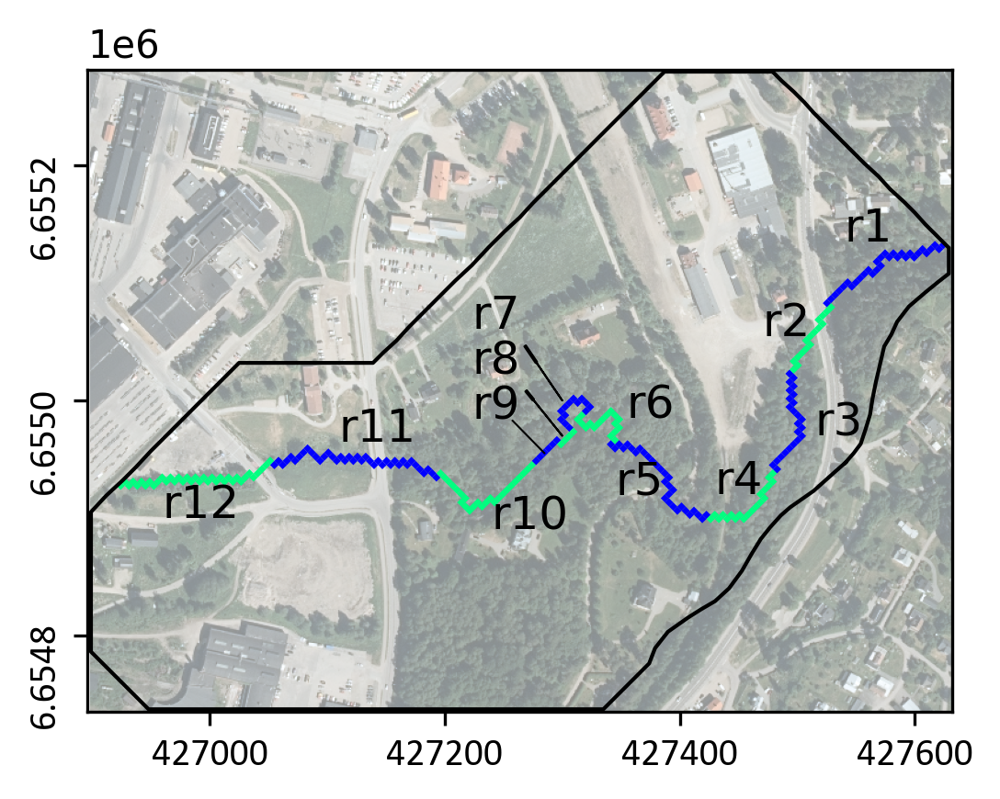

In [65]:
fig = plt.figure(figsize=(5,3), dpi=300)
ax = fig.add_subplot(1, 1, 1, aspect='equal')
rasterio.plot.show(ortophoto.read(), transform=ortophoto.transform, ax=ax, alpha=0.5)

modelmap = flopy.plot.PlotMapView(model=gwf)
#linecollection = modelmap.plot_grid(lw=0.25)
quadmesh = modelmap.plot_array(disv_df.color, masked_values=[0.0], cmap='winter')

# Display model boundary
plt.plot(mlb_shape[:,0],mlb_shape[:,1], c='k', lw=1, label='Örbäcken')

ax.text(427540, 6655135, 'r1', fontsize=12)
ax.text(427470, 6655055, 'r2', fontsize=12)
ax.text(427515, 6654970, 'r3', fontsize=12)
ax.text(427430, 6654920, 'r4', fontsize=12)
ax.text(427345, 6654920, 'r5', fontsize=12)
ax.text(427355, 6654985, 'r6', fontsize=12)
ax.annotate('r7', xy=(427300, 6655000),  xycoords='data',
            xytext=(0.5, 0.65), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', width=0.5, headwidth=0.0, shrink=0, linewidth=0.5),
            horizontalalignment='right', verticalalignment='top', fontsize=12,
            )
ax.annotate('r8', xy=(427300, 6654970),  xycoords='data',
            xytext=(0.5, 0.58), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', width=0.5, headwidth=0.0, shrink=0, linewidth=0.5),
            horizontalalignment='right', verticalalignment='top', fontsize=12,
            )
ax.annotate('r9', xy=(427285, 6654955),  xycoords='data',
            xytext=(0.5, 0.51), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', width=0.5, headwidth=0.0, shrink=0, linewidth=0.5),
            horizontalalignment='right', verticalalignment='top', fontsize=12,
            )
ax.text(427240, 6654890, 'r10', fontsize=12)
ax.text(427110, 6654965, 'r11', fontsize=12)
ax.text(426960, 6654900, 'r12', fontsize=12)

ax.set_xlim([mlb_shape[:,0].min() - 3, mlb_shape[:,0].max() + 3])
ax.set_ylim([mlb_shape[:,1].min() - 2, mlb_shape[:,1].max() + 2])

plt.xticks(fontsize=10, fontname='Calibri')
plt.yticks(fontsize=10, fontname='Calibri', rotation=90)

plt.locator_params(nbins=5)

#from rasterio.plot import show
plt.savefig(os.path.join(results_ws, 'reaches_map.png'))
#rasterio.plot.show(ortophoto.read(), transform=ortophoto.transform, alpha=0.1)

plt.tight_layout()
plt.show()

### Visualize seasonal results

In [66]:
# Load obs file to extract timesteps
hds_obs = pd.read_csv(os.path.join(ml_ws, 'runmodel', 'model', 'head.obs.csv'))
hds_obs.time.head()

0     1.000000
1     8.033019
2    15.066038
3    22.099057
4    29.132075
Name: time, dtype: float64

In [67]:
# Use timesteps in obs file to create a date range from the first to the last time step
dr = pd.to_datetime('2015-11-30') + pd.to_timedelta(hds_obs.time.values,unit='d') # date range

In [68]:
# Setup a list containing a season classifier for each model timestep based on which month
# each corresponding timestep belongs to.
dr_month = [] # date range season
for i in dr:
    if i.month == 1:
        dr_month.append('Jan')
    elif i.month == 2:
        dr_month.append('Feb')
    elif i.month == 3:
        dr_month.append('Mar')
    elif i.month == 4:
        dr_month.append('Apr')
    elif i.month == 5:
        dr_month.append('May')
    elif i.month == 6:
        dr_month.append('Jun')
    elif i.month == 7:
        dr_month.append('Jul')
    elif i.month == 8:
        dr_month.append('Aug')
    elif i.month == 9:
        dr_month.append('Sep')
    elif i.month == 10:
        dr_month.append('Oct')
    elif i.month == 11:
        dr_month.append('Nov')
    elif i.month == 12:
        dr_month.append('Dec')

In [69]:
# Instantiate a data frame containing datetime, month and timestep number of each model timestep
dr_month_df = pd.DataFrame({'date': dr, 'month': dr_month, 'timestep': [i for i in range(1, 214)]})
dr_month_df.head()

,date,month,timestep
0,2015-12-01 00:00:00.000000000,Dec,1
1,2015-12-08 00:47:32.830195200,Dec,2
2,2015-12-15 01:35:05.660390400,Dec,3
3,2015-12-22 02:22:38.490585600,Dec,4
4,2015-12-29 03:10:11.320780800,Dec,5


In [70]:
# remove columns pertaining to the first four weeks (december of 2015)
rem_cols_idx = [] # columns to remove by index
for i in range(0, len(flux_reach_pt_nb.columns), 213):
    rem_cols_idx.append(i)
    rem_cols_idx.append(i+1)
    rem_cols_idx.append(i+2)
    rem_cols_idx.append(i+3)
    rem_cols_idx.append(i+4)

In [71]:
flux_rpr_pr = flux_reach_pr_nb.drop(flux_reach_pr_nb.columns[rem_cols_idx], axis=1) # Flux results per reach, prior
flux_rpr_pt = flux_reach_pt_nb.drop(flux_reach_pt_nb.columns[rem_cols_idx], axis=1) # Flux results per reach, posterior
flux_rpr_pt.head()

,lk-1_6,lk-1_7,lk-1_8,lk-1_9,lk-1_10,lk-1_11,lk-1_12,lk-1_13,lk-1_14,lk-1_15,...,lk-263_204,lk-263_205,lk-263_206,lk-263_207,lk-263_208,lk-263_209,lk-263_210,lk-263_211,lk-263_212,lk-263_213
5,1108.2730,1109.6770,1117.2100,1103.5220,1116.7690,1116.8790,1101.0210,1098.4050,1108.8870,1101.6540,...,-833.5699,-836.5449,-821.9626,-794.2087,-818.0935,-826.5703,-806.5696,-844.2895,-843.2637,-852.8107
29,513.8150,513.7582,518.0571,509.2021,517.6482,512.8422,505.4260,499.7063,505.3952,500.1193,...,-284.2563,-292.0892,-283.5689,-244.8244,-264.3290,-269.9344,-235.2109,-270.6375,-273.8285,-282.4724
36,403.9938,403.1561,407.5920,403.2684,408.0058,405.9456,401.0504,399.0094,403.3166,400.8621,...,-154.6777,-159.3046,-153.0794,-136.0420,-146.6558,-150.4281,-135.3557,-153.3282,-153.5105,-159.5103
48,552.0771,552.9532,556.0273,546.5616,555.0113,553.6763,545.4358,542.0851,545.9525,543.9380,...,-172.7583,-179.4006,-170.9828,-147.1240,-157.4091,-164.2711,-139.6901,-161.1149,-163.8816,-166.3194
64,339.9874,342.2910,344.3886,339.0107,344.0394,344.9450,339.2016,336.3969,340.2735,337.9941,...,-313.6435,-314.7453,-309.8631,-294.6933,-306.8493,-311.8275,-301.4927,-320.3252,-321.0327,-324.0650


In [72]:
# Because the first five weeks pertain to december 2015 and now have been removed, 
# we are left with 208 timesteps (52 weeks per year * four years == 208 timesteps)

In [73]:
#flux_rpr.mean()[0::208].values

In [74]:
ts_updated = 208 # timesteps updated

weekly_results_ensemble_mean = []
weekly_results_ensemble_stdev = []

flux_rpr_mean_pt = flux_rpr_pt.mean()
flux_rpr_std_pt = flux_rpr_pt.std()

for i, ts in enumerate(range(ts_updated)):
    
    week = i + 1 # Week 1 refers to first week of January 2016, week 208 refers to last week of December 2019
    
    weekly_results_ensemble_mean.append(flux_rpr_mean_pt[ts::ts_updated].values)
    weekly_results_ensemble_stdev.append(flux_rpr_std_pt[ts::ts_updated].values)

In [1]:
#np.array(weekly_results_ensemble_mean)

In [76]:
wrem_df = pd.DataFrame(weekly_results_ensemble_mean) # Create a dataframe of weekly results ensemble mean values
wrem_df.head()

,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,257,258,259,260,261,262
0,490.275964,163.679011,243.314667,319.124552,187.486915,165.613180,324.969759,24.936074,254.896202,261.269331,...,-207.686692,-13.207242,-214.856538,-77.266409,-222.296418,-111.881289,-221.683722,-216.330462,-292.311820,-366.868360
1,490.542830,163.763633,243.467516,319.338869,187.590498,165.714777,325.194405,24.948130,255.102110,261.407050,...,-208.710091,-13.273502,-215.412587,-77.467011,-222.450662,-112.082799,-221.736748,-216.348973,-292.043941,-366.473016
2,495.392588,165.263594,245.799625,322.365848,189.214844,167.219794,328.135241,25.145607,257.481615,263.528902,...,-209.715156,-13.286215,-214.578514,-76.803440,-220.031061,-111.012432,-219.500718,-213.505125,-288.536614,-360.849944
3,487.356304,162.764726,241.836574,317.227560,186.486408,164.625503,323.105858,24.812732,253.332068,259.879637,...,-208.615557,-13.315344,-216.496062,-78.194333,-224.539024,-113.091460,-223.518719,-218.711183,-294.523119,-370.664767
4,494.604503,165.085443,245.560629,322.162794,189.141275,167.173452,328.128094,25.146964,257.546143,263.612427,...,-209.953300,-13.307546,-214.779644,-76.917002,-220.217903,-111.203129,-219.746151,-213.854565,-288.901660,-361.420087


In [77]:
wrestd_df = pd.DataFrame(weekly_results_ensemble_stdev) # Create a dataframe of weekly results ensemble mean values
wrestd_df.head()

,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,257,258,259,260,261,262
0,173.673419,52.844551,68.390694,88.923672,47.220037,41.868189,95.783719,8.866679,84.550262,78.934543,...,93.750262,6.401134,83.783241,30.281206,98.867771,49.194760,96.568671,92.710627,150.530989,200.908907
1,173.586018,52.830543,68.417656,89.017744,47.259824,41.925388,95.926924,8.871501,84.656997,78.969186,...,94.130969,6.448302,83.882478,30.391467,98.958398,49.364001,96.569959,92.747663,150.565658,201.126089
2,175.474703,53.336065,69.050895,89.801419,47.593902,42.227012,96.655077,8.915151,85.236548,79.470170,...,94.912635,6.520232,83.793578,30.450494,99.076214,49.609217,96.256277,92.376905,149.845597,200.136501
3,172.502532,52.503504,67.951315,88.412190,46.990623,41.642479,95.256715,8.831450,84.080812,78.489010,...,93.642499,6.401968,83.868786,30.351121,98.919236,49.227460,96.720882,93.009570,150.837774,201.612421
4,175.418637,53.308051,69.086923,89.878215,47.628598,42.268110,96.750479,8.917561,85.306843,79.513723,...,95.078222,6.540697,83.987016,30.545971,99.325409,49.797245,96.461793,92.593843,150.033713,200.424915


In [79]:
# Create a dataframe of 2016 and transpose so that weeks are on the x axis and reaches are on the y axis
wrem_2016_df = wrem_df.iloc[:52].T
wrem_2016_df.index = [i + 1 for i in range(len(wrem_2016_df))]
wrem_2016_df.columns = [i + 1 for i in range(len(wrem_2016_df.columns))]
wrem_2016_df.head()

,1,2,3,4,5,6,7,8,9,10,...,43,44,45,46,47,48,49,50,51,52
1,490.275964,490.542830,495.392588,487.356304,494.604503,494.563958,485.391781,480.685901,486.531178,482.928265,...,506.999786,509.081005,503.531675,507.599840,507.197735,492.219196,491.986237,494.554274,497.178933,495.789208
2,163.679011,163.763633,165.263594,162.764726,165.085443,165.045171,162.205162,160.815857,162.690059,161.587572,...,168.559094,169.211514,167.458848,168.732206,168.621550,163.896804,163.932020,164.770053,165.595058,165.177470
3,243.314667,243.467516,245.799625,241.836574,245.560629,245.472087,240.983626,238.794590,241.746632,240.054141,...,250.639926,251.770511,249.032028,251.082715,251.031703,243.548190,243.624147,244.991427,246.296781,245.631804
4,319.124552,319.338869,322.365848,317.227560,322.162794,322.103040,316.302748,313.564833,317.446385,315.293486,...,327.870725,329.381879,325.827452,328.506939,328.504124,318.798120,319.006300,320.851830,322.552173,321.703223
5,187.486915,187.590498,189.214844,186.486408,189.141275,189.018588,185.923099,184.543140,186.687235,185.532293,...,192.260080,193.026570,191.077970,192.505163,192.402939,187.116431,187.322911,188.345028,189.249188,188.796396


In [80]:
wrem_2017_df = wrem_df.iloc[52:52*2].T
wrem_2017_df.index = [i + 1 for i in range(len(wrem_2017_df))]
wrem_2017_df.columns = [i + 1 for i in range(len(wrem_2017_df.columns))]
wrem_2017_df.head()

,1,2,3,4,5,6,7,8,9,10,...,43,44,45,46,47,48,49,50,51,52
1,494.982760,497.100488,487.073280,492.775309,493.465593,495.242855,487.171931,485.023048,501.404173,483.636514,...,506.205005,499.350266,503.421097,500.201044,519.528419,498.560419,506.466806,496.496508,496.519666,510.504466
2,164.933745,165.622270,162.477282,164.304067,164.542469,165.111709,162.598399,162.032943,167.125387,161.478248,...,168.116889,166.036916,167.372948,166.379594,172.400015,165.795227,168.316881,165.267457,165.344540,169.709981
3,245.267979,246.422126,241.449262,244.273157,244.648694,245.543027,241.548377,240.744420,248.837745,239.883058,...,250.159314,246.879132,248.998617,247.476607,257.016652,246.623933,250.543793,245.781445,245.916537,252.786574
4,321.264378,322.837356,316.402058,320.094000,320.607427,321.781272,316.594926,315.687078,326.236984,314.539672,...,327.125648,322.950136,325.744452,323.811118,336.208212,322.711118,327.855101,321.771553,322.035607,331.003128
5,188.563147,189.381056,185.882369,187.939446,188.239620,188.880546,186.116203,185.689257,191.240445,184.874690,...,191.511155,189.350703,190.916925,189.862138,196.405448,189.097096,191.893990,188.676517,188.879202,193.650407


In [81]:
wrem_2018_df = wrem_df.iloc[52*2:52*3].T
wrem_2018_df.index = [i + 1 for i in range(len(wrem_2018_df))]
wrem_2018_df.columns = [i + 1 for i in range(len(wrem_2018_df.columns))]

In [82]:
wrem_2019_df = wrem_df.iloc[52*3:].T
wrem_2019_df.index = [i + 1 for i in range(len(wrem_2019_df))]
wrem_2019_df.columns = [i + 1 for i in range(len(wrem_2019_df.columns))]

In [83]:
# Create a dataframe of 2016 and transpose so that weeks are on the x axis and reaches are on the y axis
wrestd_2016_df = wrestd_df.iloc[:52].T
wrestd_2016_df.index = [i + 1 for i in range(len(wrestd_2016_df))]
wrestd_2016_df.columns = [i + 1 for i in range(len(wrestd_2016_df.columns))]

wrestd_2017_df = wrestd_df.iloc[52:52*2].T
wrestd_2017_df.index = [i + 1 for i in range(len(wrestd_2017_df))]
wrestd_2017_df.columns = [i + 1 for i in range(len(wrestd_2017_df.columns))]

wrestd_2018_df = wrestd_df.iloc[52*2:52*3].T
wrestd_2018_df.index = [i + 1 for i in range(len(wrestd_2018_df))]
wrestd_2018_df.columns = [i + 1 for i in range(len(wrestd_2018_df.columns))]

wrestd_2019_df = wrestd_df.iloc[52*3:].T
wrestd_2019_df.index = [i + 1 for i in range(len(wrestd_2019_df))]
wrestd_2019_df.columns = [i + 1 for i in range(len(wrestd_2019_df.columns))]

In [84]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(
    2,
    4,
    figsize=(8, 9), 
    dpi=1200,
    gridspec_kw={'width_ratios': [1, 1, 1, 1.25]}
)

fig.suptitle('Mean SW-GW flux (posterior ensemble)', fontsize=16, fontfamily='Calibri', weight='bold')

vcenter = 0
vmin, vmax = wrem_df.min().min(), wrem_df.max().max()

normalize = TwoSlopeNorm(vcenter=vcenter, vmin=vmin, vmax=vmax)

axs = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]
hline_ypos = [31, 47, 71, 91, 121, 138, 151, 155, 161, 186, 226]
years_labels = ['2016', '2017', '2018', '2019']
x_loc = np.linspace(0, 48, 12)
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

for ax in axs:
    ax.get_yaxis().set_visible(False)
    for ypos in hline_ypos:
        ax.axhline(y=ypos, c='k', ls='--', lw=1.)

for ax_upper, ax_lower, label in zip(axs[:4], axs[4:], years_labels):
    ax_upper.set_title(label, fontname='Calibri', fontsize=14)
    ax_lower.set_title(label, fontname='Calibri', fontsize=14)
        
sns.heatmap(wrem_2016_df, norm=normalize, cmap='seismic', ax=ax1, cbar=False)
sns.heatmap(wrem_2017_df, norm=normalize, cmap='seismic', ax=ax2, cbar=False)
sns.heatmap(wrem_2018_df, norm=normalize, cmap='seismic', ax=ax3, cbar=False)
cbar_upper = sns.heatmap(wrem_2018_df, norm=normalize, cmap='seismic', ax=ax4, cbar=True, cbar_kws={'label': 'm$^3$/d'})
cbar_upper.figure.axes[-1].yaxis.label.set_size(14)
cbar_upper.figure.axes[-1].tick_params(labelsize=12)

sns.heatmap(wrestd_2016_df, cmap='Greys', ax=ax5, cbar=False)
sns.heatmap(wrestd_2017_df, cmap='Greys', ax=ax6, cbar=False)
sns.heatmap(wrestd_2018_df, cmap='Greys', ax=ax7, cbar=False)
cbar_lower = sns.heatmap(wrestd_2019_df, cmap='Greys', ax=ax8, cbar=True, cbar_kws={'label': 'm$^3$/d'})
cbar_lower.figure.axes[-1].yaxis.label.set_size(14)
cbar_lower.figure.axes[-1].tick_params(labelsize=12)

for ax in [ax1, ax5]:
    ax.text(-8, 19, 'r1', fontsize=12)
    ax.text(-8, 43, 'r2', fontsize=12)
    ax.text(-8, 63, 'r3', fontsize=12)
    ax.text(-8, 85, 'r4', fontsize=12)
    ax.text(-8, 110, 'r5', fontsize=12)
    ax.text(-8, 133, 'r6', fontsize=12)
    ax.text(-8, 146, 'r7', fontsize=11)
    ax.text(-7.5, 155.8, 'r8', fontsize=10)
    ax.text(-8, 165.5, 'r9', fontsize=11)
    ax.text(-12., 178, 'r10', fontsize=12)
    ax.text(-12., 210, 'r11', fontsize=12)
    ax.text(-12., 248, 'r12', fontsize=12)

for ax in fig.get_axes():
    ax.label_outer()

# Red = Losing (Stream loss == Groundwater recharge)
# Blue = Gaining (Stream gains == Groundwater discharge)
plt.figtext(0.962,0.88, 'Losing', ha='center', va='top', fontsize=16, fontfamily='Calibri', c='r', rotation=90)
plt.figtext(0.962,0.66, 'Gaining', ha='center', va='top', fontsize=16, fontfamily='Calibri', c='b', rotation=90)

plt.figtext(0.5,0.5, 'Standard deviation to the mean', ha='center', va='top', fontsize=16, fontfamily='Calibri', weight='bold')

for ax in axs:
    ax.set_xticks(x_loc)
ax5.set_xticklabels(months, fontsize=11.5, fontfamily='Calibri')

plt.tight_layout()

plt.subplots_adjust(hspace = .25, wspace=0.07)

plt.savefig(os.path.join(results_ws, 'results.png'))

### Potential mass influx of PCE from GW to SW.

1. For each chemistry sample collected (measured in concentration of µg/l), calculate the mass flux needed to explain the measured concentration (for each realization of both the prior and posterior ensemble).

2. Add the result of from 1.) to a list.

3. Use the ensemble of results to estimate total yearly mass input.

#### Psuedo code:

```
For every chemistry sample:
    For every realization:
        Calculate the sum of all upstream SFR cell GW to SW influx
        Divide the sum by the outflow of the SFR cell from which a chemistry sample was collected
        Use the ratio calcated to arrive at the PCE concentration of influx water
        Multiply by 365 to arrive at a yearly mass transfer
```

In [85]:
prior_pce_mass_influx = []
psoterior_pce_mass_influx = []

In [86]:
# Read chemistry csv
chem_df = pd.read_csv(os.path.join(chemdata_ws, 'chem_grab_samples.csv'), encoding='latin-1')
chem_df['date'] = pd.to_datetime(chem_df.date)
chem_df = chem_df.sort_values('date')
chem_df = chem_df.loc[chem_df.date > '2015-12-31'].reset_index(drop=True)
chem_df['pce_µg_l'] = pd.to_numeric(chem_df['pce_µg_l'].str.replace('<0.020', '0.0'))
print(f'The number of samples are: {len(chem_df)}')
chem_df.head()

The number of samples are: 631


C:\Users\nat12nho\AppData\Local\Temp\ipykernel_10244\373058610.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  chem_df['pce_µg_l'] = pd.to_numeric(chem_df['pce_µg_l'].str.replace('<0.020', '0.0'))


,sample_site,x,y,sample_comment,sample_type,date,pce_µg_l
0,NI15-Ö34,427291.5384,6654968.993,NI15-Ö34,Grab sample,2016-02-26,380.0
1,NI15-Ö29,427416.7099,6654904.258,NI15-Ö29,Grab sample,2016-02-26,0.0
2,NI15-Ö33,427304.6882,6654981.109,NI15-Ö33,Grab sample,2016-02-26,18.0
3,NI15-Ö35,427294.3559,6654961.399,NI15-Ö35,Grab sample,2016-02-26,17.0
4,NI15-Ö32,427332.1978,6654979.689,NI15-Ö32,Grab sample,2016-02-26,15.0


In [87]:
# Read SFR cell coordinates
sfr_df = pd.DataFrame.from_records(sfr.packagedata.array)
sfr_cell_pos_df = pd.read_csv(os.path.join(preproc_ws, 'sfr_segfile.dat'), sep='\t', header=None, names=['x', 'y', 'irrelevant_col']).iloc[::-1]
sfr_cell_pos_df = sfr_cell_pos_df.reset_index(drop=True)
sfr_cell_pos_df['point'] = [(r.x, r.y) for i,r in sfr_cell_pos_df.iterrows()]
sfr_cell_pos_df['sfr_cell'] = sfr_cell_pos_df.index + 1
sfr_cell_pos_df['bound'] = sfr_df.boundname
sfr_cell_pos_df.head()

,x,y,irrelevant_col,point,sfr_cell,bound
0,427624.264,6655132.358,s52,"(427624.264, 6655132.358)",1,bound1
1,427620.729,6655128.823,s52,"(427620.729, 6655128.823)",2,bound1
2,427617.193,6655132.358,s52,"(427617.193, 6655132.358)",3,bound1
3,427613.657,6655128.823,s52,"(427613.657, 6655128.823)",4,bound1
4,427610.122,6655125.287,s52,"(427610.122, 6655125.287)",5,bound1


In [88]:
# Sample date range (model timestep to datetime)
ts_daterange = pd.date_range(start='2016-01-01', end='2020-01-01', periods=208)

#### Determine flow regimes (low, regular and high flow per cell)

In [89]:
flow_regimes_df = of_reach_pt_nb.T * -1
sfr_cells_computed_flows_pt = {}
for i in range(1, 263):
    sfr_cells_computed_flows_pt[f'cell_{i}'] = []

In [90]:
for ts in range(1, 214):
    ts_flows = flow_regimes_df.loc[flow_regimes_df.index.str.contains(f'_{ts}')]
    for sfr_cell in range(1, 263):
        
        cell_flows = ts_flows.loc[ts_flows.index.str.contains(f'of-{sfr_cell}_')]
        
        for flow in cell_flows.T.values.flatten():
            sfr_cells_computed_flows_pt[f'cell_{sfr_cell}'].append(flow)

In [91]:
sfr_cells_flows_pt_df = pd.DataFrame(sfr_cells_computed_flows_pt)

In [92]:
sfr_cells_flows_pt_df.describe()

,cell_1,cell_2,cell_3,cell_4,cell_5,cell_6,cell_7,cell_8,cell_9,cell_10,...,cell_253,cell_254,cell_255,cell_256,cell_257,cell_258,cell_259,cell_260,cell_261,cell_262
count,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,...,257535.000000,257535.00000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000,257535.000000
mean,20368.946791,20202.633230,19955.296674,19631.271062,19441.091421,19272.939526,18943.391576,18918.121561,18659.608328,18394.898904,...,20421.864898,20621.95486,20634.563082,20842.426059,20916.277776,21131.745950,21239.022279,21454.489753,21662.763898,21947.685569
std,13879.667791,13878.631344,13877.216549,13875.702573,13875.149541,13874.742887,13874.130650,13874.119712,13874.048286,13874.351155,...,13626.918418,13633.57285,13633.962609,13638.003676,13639.184140,13641.444644,13643.264089,13646.506132,13649.657883,13654.788047
min,3000.972000,2609.934000,2034.954000,1127.092000,605.375200,0.001939,0.001804,0.001801,0.000874,0.000821,...,3874.699000,4015.64100,4023.749000,4109.408000,4125.631000,4173.116000,4184.643000,4263.490000,4339.325000,4466.832000
25%,10478.230000,10308.750000,10065.310000,9753.020000,9560.807500,9399.196000,9071.816000,9047.442000,8796.637000,8532.520000,...,10631.380000,10832.72000,10843.210000,11053.995000,11128.495000,11344.570000,11452.520000,11671.180000,11880.760000,12174.430000
50%,15774.590000,15603.730000,15363.490000,15045.950000,14857.870000,14691.760000,14376.710000,14349.310000,14093.430000,13836.110000,...,15942.060000,16145.12000,16157.700000,16369.140000,16443.800000,16667.160000,16777.840000,17003.060000,17219.560000,17514.920000
75%,26018.060000,25856.240000,25591.605000,25253.160000,25068.700000,24902.150000,24574.510000,24549.240000,24313.470000,24061.150000,...,26168.835000,26385.16000,26399.830000,26628.570000,26699.135000,26917.195000,27038.830000,27248.860000,27454.860000,27755.300000
max,83599.550000,83378.120000,83006.820000,82522.800000,82253.300000,82088.480000,81746.280000,81722.690000,81444.840000,81193.050000,...,83705.740000,84077.76000,84096.340000,84500.030000,84625.060000,85058.440000,85244.950000,85637.520000,85992.910000,86360.030000


#### Determine flow regimes (low, regular and high flow per timestep)

In [93]:
flow_regimes_df

,5,29,36,48,64,99,136,178,200,202,...,487,488,489,491,492,494,495,496,497,498
of-1_1,12965.820,7998.450,7791.629,8610.545,8227.77,9668.717,8084.953,12269.28,7668.712,7597.401,...,11151.640,12023.540,8491.762,7398.958,4668.900,12564.740,7560.813,7412.189,8890.067,6830.122
of-1_2,29976.950,29916.690,31248.440,30475.410,29814.60,30343.590,28773.890,31193.82,30270.380,31330.370,...,28182.600,28536.370,29483.200,31566.690,31036.110,28914.560,29138.330,30590.800,31868.040,30635.010
of-1_3,37346.790,37975.650,41599.740,39435.820,38587.34,36992.010,38483.050,41987.77,42838.540,38877.620,...,37036.510,39015.440,40602.860,33551.040,40965.380,35512.970,34636.110,40249.340,35955.480,38775.570
of-1_4,27435.790,27444.250,28124.410,29605.620,27777.72,32324.860,25915.000,23156.44,23656.870,24697.950,...,25781.620,26681.950,27623.460,31103.250,28322.690,25803.550,22734.540,27845.170,29194.390,28330.690
of-1_5,8903.216,7613.833,8956.891,9219.125,10074.36,7431.607,6943.458,10251.54,7851.531,8749.339,...,8408.439,8577.821,8397.967,8030.599,8562.564,8234.189,8055.394,10035.370,9503.581,7734.373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
of-262_209,39499.520,40674.000,38057.420,36446.200,37000.22,37264.960,38086.930,37042.53,38375.130,41820.190,...,38883.790,35352.050,36324.860,34901.830,32825.130,37948.340,37378.850,36917.250,41111.550,41384.330
of-262_210,80770.000,82989.270,80442.060,78156.270,77055.97,78882.880,81516.560,78337.41,81189.620,76484.240,...,81326.320,76678.060,78027.310,75548.410,83344.870,79210.410,76905.120,79824.770,82303.100,81576.550
of-262_211,47186.300,49287.270,46646.350,48258.680,47689.26,48484.270,47828.920,45354.00,47294.650,48107.910,...,48671.480,46034.340,46729.170,44068.560,46442.470,46334.510,48966.450,48353.420,52551.180,48597.340
of-262_212,46094.730,44522.770,44762.940,40568.180,42778.77,40169.440,44505.090,41963.23,42159.780,43033.390,...,45216.320,42681.270,43557.240,42242.740,45919.350,42118.480,44706.490,41364.050,41821.690,46239.660


In [94]:
timestep_mean_flows = {}
for ts in range(1, 214):
    ts_flows = flow_regimes_df.loc[flow_regimes_df.index.str.contains(f'_{ts}')]
    
    timestep_mean_flows[f'timestep_{ts}'] = []
    timestep_mean_flows[f'timestep_{ts}'].append(ts_flows.mean().mean())

In [95]:
mean_flows_per_ts_df = pd.DataFrame(timestep_mean_flows).T
mean_flows_per_ts_df = mean_flows_per_ts_df.reset_index(drop=True)
mean_flows_per_ts_df.index = mean_flows_per_ts_df.index + 1
mean_flows_per_ts_df

,0
1,14171.672840
2,29825.890314
3,14677.962553
4,12575.206479
5,12413.568636
...,...
209,32699.395996
210,74021.753750
211,41570.579972
212,37797.770239


In [96]:
timestep_flow_regime_labels = []
ts_flows_25_percentile = mean_flows_per_ts_df.describe().T['25%'][0]
ts_flows_75_percentile = mean_flows_per_ts_df.describe().T['75%'][0]
for i, r in mean_flows_per_ts_df.iterrows():
    if r[0] < ts_flows_25_percentile:
        timestep_flow_regime_labels.append({'timestep': i, 'flow_regime': 'Low'})
    elif r[0] > ts_flows_75_percentile:
        timestep_flow_regime_labels.append({'timestep': i, 'flow_regime': 'High'})
    else:
        timestep_flow_regime_labels.append({'timestep': i, 'flow_regime': 'Regular'})

In [97]:
timestep_flow_regime_labels_df = pd.DataFrame(timestep_flow_regime_labels)
timestep_flow_regime_labels_df

,timestep,flow_regime
0,1,Regular
1,2,High
2,3,Regular
3,4,Regular
4,5,Regular
...,...,...
208,209,High
209,210,High
210,211,High
211,212,High


In [98]:
# For every chem sample, find the nearest SFR reach,
# then get the stream flow for the nearest sample date
# as well as the flux for the nearest sample dates
yearly_mass_influx_pt_results = []
yearly_mass_influx_pr_results = []
unmixed_concentrations_influx_results = []

influx_model_data = []
daily_mass_influx_pt_results_series = []

# Concentration peaks investigation
peak1_strt, peak1_stop = 30 / 365, 120 / 365
peak2_strt, peak2_stop = 120 / 365, 300 / 365
conc_peak_investigation = []

for i,r in chem_df.iterrows():
    chem_sample_coords = np.array((r.x, r.y))
    sfr_cell_coords = np.array([np.array(i) for i in sfr_cell_pos_df.point.values])
    
    distances = np.linalg.norm(sfr_cell_coords-chem_sample_coords, axis=1)
    min_index = np.argmin(distances)
    
    # The distance between SFR cell centerpoint and actual sample coordinate will typically be
    # less than five meters. However, some samples, likely due to human error, will have a minimum
    # distance to the center of the SFR cell higher than 10 meters (some even higher than 400 meters).
    # These points will be treated as "bad data" and be discarded (approx 3 out of > 100)
    if distances[min_index] > 10:
        pass
    else:
        sample_date = r.date
        sample_site = r.sample_site
        concentration = r['pce_µg_l']
        concentration_distribution_pt = np.random.normal(loc=concentration, scale=(concentration * .2)/4, size=len(of_reach_pt_nb))
        concentration_distribution_pr = np.random.normal(loc=concentration, scale=(concentration * .2)/4, size=len(of_reach_pr_nb))
        sfr_cell = sfr_cell_pos_df.iloc[min_index].sfr_cell
        bound = sfr_cell_pos_df.iloc[min_index].bound

        # The flow of all realizations and all timesteps through the SFR cell from which
        # the chemical sample was collected -> for both prior and posterior realizations
        # multiply by -1 to convert flows into positive numbers (currently negative as
        # water is leaving the cell as flow)
        sfr_cell_flows_pt = of_reach_pt_nb.T.loc[of_reach_pt_nb.T.index.str.contains(f'-{sfr_cell}_')].iloc[5:] * -1
        sfr_cell_flows_pr = of_reach_pr_nb.T.loc[of_reach_pr_nb.T.index.str.contains(f'-{sfr_cell}_')].iloc[5:] * -1

        # Find the nearest model output to the chemistry sample date (this will be anywhere from)
        # the same day up to three days offset.
        sample_date_ml_out_idx = ts_daterange.get_indexer([sample_date], method='nearest')[0]

        # All computed flows of the SFR cell where sample was collected
        # at nearest model output to sample collection date
        sfr_cell_flows_pt_near_sample_date = sfr_cell_flows_pt.iloc[sample_date_ml_out_idx]
        sfr_cell_flows_pr_near_sample_date = sfr_cell_flows_pr.iloc[sample_date_ml_out_idx]

        # Retrieve the timestep name (e.g. from of-221_202 retrieve 202)
        timestep_name = sfr_cell_flows_pt_near_sample_date.name.split('_')[1]
        timestep_name
        
        # Recreate a list of all reaches/sfr-cells pertaining to fluxes of the current time step
        timestep_fluxes_idx = [f'lk-{i}_{timestep_name}' for i in range(1,264)]
        
        # Get all fluxes for all realizations pertaining to the current time step and
        # convert positive to negative (and vice versa) so that influx of GW to SW becomes
        # a positive number
        sfr_cell_flux_pt = flux_reach_pt_nb[timestep_fluxes_idx].T * -1 # posterior fluxes
        sfr_cell_flux_pr = flux_reach_pr_nb[timestep_fluxes_idx].T * -1 # prior fluxes
        
        # Här måste uppströms reaches selekteras
        upstream_cells = [f'lk-{i}_{timestep_name}' for i in range(1, sfr_cell)]
        sfr_cell_upstream_flux_pt = sfr_cell_flux_pt.loc[sfr_cell_flux_pt.index.isin(upstream_cells)]
        sfr_cell_upstream_flux_pr = sfr_cell_flux_pr.loc[sfr_cell_flux_pr.index.isin(upstream_cells)]
        
        # Get the ratio of all upstream influx (gw->sw) to outflow of the sampled SFR cell
        # for calculating the unmixed concentration of influx water
        upstream_influx_outflow_ratio_pt = sfr_cell_upstream_flux_pt[sfr_cell_upstream_flux_pt > 0].sum() / sfr_cell_flows_pt_near_sample_date
        upstream_influx_outflow_ratio_pr = sfr_cell_upstream_flux_pr[sfr_cell_upstream_flux_pr > 0].sum() / sfr_cell_flows_pr_near_sample_date
        # upstream_influx_outflow_ratio_pt = sfr_cell_flux_pt[sfr_cell_flux_pt > 0].sum() / sfr_cell_flows_pt_near_sample_date
        # upstream_influx_outflow_ratio_pr = sfr_cell_flux_pr[sfr_cell_flux_pr > 0].sum() / sfr_cell_flows_pr_near_sample_date
        
        # Calculate the unmixed concentration of influx water (from gw -> sw) in micrograms per liter
        unmixed_concentration_influx_pt = concentration_distribution_pt / upstream_influx_outflow_ratio_pt # posterior
        unmixed_concentration_influx_pr = concentration_distribution_pr / upstream_influx_outflow_ratio_pr # prior
        #unmixed_concentration_influx_pt = concentration / upstream_influx_outflow_ratio_pt # posterior
        #unmixed_concentration_influx_pr = concentration / upstream_influx_outflow_ratio_pr # prior
        
        # Append posterior mean ug/l results
        unmixed_concentrations_influx_results.append(unmixed_concentration_influx_pt.mean())
        
        # Convert micrograms per liter to kilograms per m3
        unmixed_concentration_influx_pt = unmixed_concentration_influx_pt * 10**-6
        unmixed_concentration_influx_pr =  unmixed_concentration_influx_pr * 10**-6
        
        # Calculate total mass influx required to justify the measured concentration
        daily_mass_influx_pt = unmixed_concentration_influx_pt * sfr_cell_upstream_flux_pt[sfr_cell_upstream_flux_pt > 0].sum()
        daily_mass_influx_pr = unmixed_concentration_influx_pr * sfr_cell_upstream_flux_pr[sfr_cell_upstream_flux_pr > 0].sum()
        
        # Extend the daily mass influx to yearly influx
        yearly_mass_influx_pt = daily_mass_influx_pt * 365
        yearly_mass_influx_pr = daily_mass_influx_pr * 365
        
        yearly_mass_influx_pt_results.append(yearly_mass_influx_pt.values)
        yearly_mass_influx_pr_results.append(yearly_mass_influx_pr.values)
        
        daily_mass_influx_pt_results_series.append(daily_mass_influx_pt)
        
        ### ifm_data
        flows_pt_mean = sfr_cell_flows_pt_near_sample_date.mean()
        percentile_25 = sfr_cells_flows_pt_df[[f'cell_{sfr_cell}']].describe().T['25%'][0]
        percentile_75 = sfr_cells_flows_pt_df[[f'cell_{sfr_cell}']].describe().T['75%'][0]
        
        if flows_pt_mean < percentile_25:
            flow_regime = 'Low'
        elif flows_pt_mean > percentile_75:
            flow_regime = 'High'
        else:
            flow_regime = 'Regular'
        
        ifm_data = { # influx model data
            'sample_date': sample_date,
            'timestep': timestep_name,
            'sfr_cell': sfr_cell,
            'sample_site': sample_site,
            'flow_regime': flow_regime,
            'flows_pt_mean': flows_pt_mean,
            'flows_pt_stdev': sfr_cell_flows_pt_near_sample_date.std(),
            'flows_pr_mean': sfr_cell_flows_pr_near_sample_date.mean(),
            'flows_pr_stdev': sfr_cell_flows_pr_near_sample_date.std(),
            'upstream_pt_influx_mean': sfr_cell_upstream_flux_pt[sfr_cell_upstream_flux_pt > 0].sum().mean(),
            'upstream_pt_influx_stdev': sfr_cell_upstream_flux_pt[sfr_cell_upstream_flux_pt > 0].sum().std(),
            'upstream_pr_influx_mean': sfr_cell_upstream_flux_pr[sfr_cell_upstream_flux_pr > 0].sum().mean(),
            'upstream_pr_influx_stdev': sfr_cell_upstream_flux_pr[sfr_cell_upstream_flux_pr > 0].sum().std(),
            'concentration_mean': concentration,
            'concentration_stdev': concentration_distribution_pt.std(),
            'daily_mass_pt_influx_mean': daily_mass_influx_pt.mean(),
            'daily_mass_pt_influx_stdev': daily_mass_influx_pt.std(),
            'daily_mass_pr_influx_mean': daily_mass_influx_pr.mean(),
            'daily_mass_pr_influx_stdev': daily_mass_influx_pr.std(),
        }
        
        influx_model_data.append(ifm_data)
        
        cpi_data = { #conc_peak_investigation
            'sample_date': sample_date,
            'timestep': timestep_name,
            'sfr_cell': sfr_cell,
            'sample_site': sample_site,
            'flow_regime': flow_regime,
            'realizations_peak1': daily_mass_influx_pt.loc[(daily_mass_influx_pt > peak1_strt) & (daily_mass_influx_pt < peak1_stop)].index.values,
            'realizations_peak2': daily_mass_influx_pt.loc[(daily_mass_influx_pt > peak2_strt) & (daily_mass_influx_pt < peak2_stop)].index.values,
            'flows_pt_mean': flows_pt_mean,
            'flows_pt_stdev': sfr_cell_flows_pt_near_sample_date.std(),
            'concentration_mean': concentration,
            'concentration_stdev': concentration_distribution_pt.std(),
            'daily_mass_pt_influx_mean': daily_mass_influx_pt.mean(),
            'daily_mass_pt_influx_stdev': daily_mass_influx_pt.std(),
        }
        
        conc_peak_investigation.append(cpi_data)

In [99]:
daily_mass_influx_pt

5      0.211217
29     0.242220
36     0.228982
48     0.229372
64     0.241327
         ...   
494    0.237198
495    0.241812
496    0.242497
497    0.207114
498    0.223899
Length: 485, dtype: float64

In [100]:
imd_df = pd.DataFrame(influx_model_data) # influx_model_data_df

In [101]:
yearly_mass_influx_pt_results = np.array(yearly_mass_influx_pt_results).flatten() # flatten results
yearly_mass_influx_pr_results = np.array(yearly_mass_influx_pr_results).flatten() # flatten results
unmixed_concentrations_influx_results = np.array(unmixed_concentrations_influx_results).flatten()

# Give the results an shorter variable reference
ymi_pt_res = yearly_mass_influx_pt_results
ymi_pr_res = yearly_mass_influx_pr_results
ucir = unmixed_concentrations_influx_results

# Select only the results with a mass influx above zero (since we objectively know there is a mass influx
# we exclude the realizations where resulting in zero mass influx)
np.log10(ymi_pt_res[ymi_pt_res != 0])
np.log10(ymi_pr_res[ymi_pr_res != 0])

array([2.61509499, 3.44147871, 4.0152121 , ..., 1.81970157, 1.69985038,
       1.27442364])

In [102]:
imd_df

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
0,2016-02-26,14,156,NI15-Ö34,Regular,19022.277381,2152.722080,25126.563960,22948.557360,3272.440090,451.790082,4338.985896,2002.842535,380.0,18.150516,7.252173,0.879346,9.528193,8.736310
1,2016-02-26,14,94,NI15-Ö29,Regular,16128.750955,2198.265204,22205.996399,23203.578184,25.514824,52.023943,441.337539,708.135384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,2016-02-26,14,150,NI15-Ö33,Regular,19256.796021,2174.399717,25347.081600,23299.097713,3196.660596,442.111437,4153.452983,1925.792870,18.0,0.937410,0.346268,0.044781,0.456992,0.422144
3,2016-02-26,14,157,NI15-Ö35,Regular,19097.474474,2153.356654,25301.148864,22998.849274,3352.819112,459.747630,4504.105327,2077.909579,17.0,0.836079,0.322561,0.039142,0.432146,0.393280
4,2016-02-26,14,132,NI15-Ö32,Regular,18160.204722,2169.512615,23678.297528,23255.160926,2024.326907,400.823085,2134.988809,1468.155343,15.0,0.735211,0.272242,0.034706,0.357824,0.350769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,2018-11-09,154,163,S6,Regular,11171.766724,1225.523202,20082.481899,20810.028208,3595.937198,466.095807,5138.597286,2384.743968,14.0,0.700153,0.156143,0.018009,0.280657,0.293197
624,2018-11-09,154,80,S2,Regular,8120.624579,1202.911896,16470.310018,20688.366181,9.200608,35.266023,267.205924,548.121413,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
625,2018-11-09,154,150,S5,Regular,10923.402381,1234.689890,19297.409180,20829.261516,3066.608804,423.277608,3868.450827,1938.589612,30.0,1.535685,0.327462,0.041216,0.579101,0.626100
626,2019-10-15,202,178,S7,High,53231.056701,1859.662632,50055.849202,28436.481311,3872.862358,618.462547,6122.290563,2735.031114,2.3,0.107754,0.122731,0.007303,0.115354,0.065893


(array([ 24., 169.,   5.,   0.,   0.,   0.,   0.,   0.,   0.,   2.]),
 array([22139.50016495, 25377.72054021, 28615.94091546, 31854.16129072,
        35092.38166598, 38330.60204124, 41568.82241649, 44807.04279175,
        48045.26316701, 51283.48354227, 54521.70391753]),
 <BarContainer object of 10 artists>)

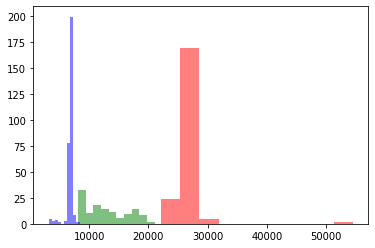

In [103]:
plt.hist(imd_df.loc[imd_df.flow_regime == 'Regular', 'flows_pt_mean'], color='green', alpha=0.5)
plt.hist(imd_df.loc[imd_df.flow_regime == 'Low', 'flows_pt_mean'], color='blue', alpha=0.5)
plt.hist(imd_df.loc[imd_df.flow_regime == 'High', 'flows_pt_mean'], color='red', alpha=0.5)

In [104]:
len(yearly_mass_influx_pt_results[yearly_mass_influx_pt_results != np.isnan(yearly_mass_influx_pt_results)])

301246

In [105]:
dmiptrs = daily_mass_influx_pt_results_series
dmiptrs_flat = np.array(dmiptrs).flatten()
dmiptrs_flat = dmiptrs_flat = dmiptrs_flat[~np.isnan(dmiptrs_flat)]
binDailyBoundaries = np.linspace(0,np.ma.array(ymi_pr_res, mask=np.isnan(ymi_pr_res)).max(),2000)
x = ymi_pr_res[~np.isnan(ymi_pr_res)]
binLogDailyBoundaries = np.linspace(np.log10(x[np.nonzero(x)]).min(), np.log10(x[np.nonzero(x)]).max(), 100)

In [106]:
def geo_mean_overflow(iterable):
    return np.exp(np.log10(iterable).mean())

In [107]:
geom_mean_pce = geo_mean_overflow(dmiptrs_flat[dmiptrs_flat!=0])

In [108]:
len(dmiptrs_flat)

293789

In [109]:
np.mean(dmiptrs_flat)

0.8363361732039305

In [110]:
np.nanstd(dmiptrs_flat)

2.8888349835732385

In [111]:
np.log10(np.mean(dmiptrs_flat[dmiptrs_flat!=0]))

-0.07266244471583146

In [112]:
np.mean(np.log10(dmiptrs_flat[dmiptrs_flat!=0]))

-0.5881618266715805

In [113]:
from scipy.stats import gmean
gmean(dmiptrs_flat[dmiptrs_flat!=0])

0.25812981689097214

In [114]:
dmiptrs_flat

array([7.22612557, 7.39353188, 7.10494188, ..., 0.24249689, 0.20711419,
       0.22389892])

In [115]:
from statistics import geometric_mean
np.log10(geometric_mean(dmiptrs_flat[dmiptrs_flat!=0]))

-0.5881618266715806

In [116]:
1 ** geometric_mean(dmiptrs_flat[dmiptrs_flat!=0])

1.0

In [117]:
geometric_mean(dmiptrs_flat[dmiptrs_flat!=0])

0.2581298168909721

In [118]:
np.std(np.log10(dmiptrs_flat[dmiptrs_flat!=0]))

0.6511461489624166

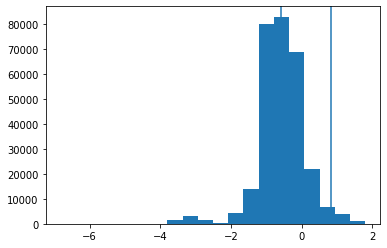

In [119]:
plt.hist(np.log10(dmiptrs_flat[dmiptrs_flat != 0]), bins=20)
plt.axvline(x=0.84)
plt.axvline(x=-0.5882)
plt.show()

In [120]:
0.5882e-1

0.05882

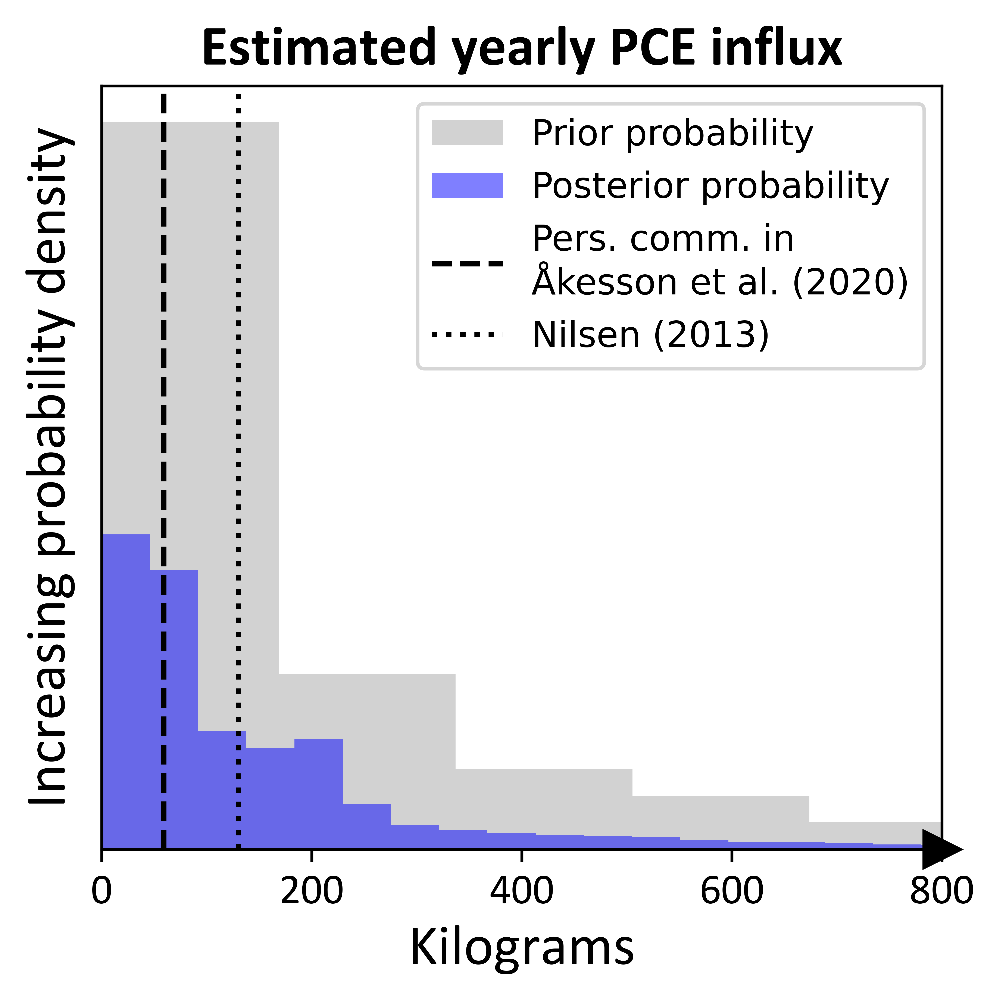

In [121]:
with plt.rc_context():
    fig, ax = plt.subplots(figsize=(4, 4), dpi=1200)
    ax.hist(ymi_pr_res[ymi_pr_res!=0], bins=500, alpha=0.35, color='grey', label='Prior probability')
    ax.hist(ymi_pt_res[ymi_pt_res!=0], bins=500, alpha=0.50, color='blue', label='Posterior probability')

    ax.spines['left'].set_position('zero')
    #ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_position('zero')
    #ax.spines['top'].set_visible(False)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    
    plt.axvline(x=59, ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    plt.axvline(x=130, ls='dotted', c='k', label='Nilsen (2013)')
    
    plt.xlabel('Kilograms', fontsize=16, fontname='Calibri')
    plt.ylabel('Increasing probability density', fontsize=16, fontname='Calibri') # Increasing probability density
    plt.xticks(fontsize=12, fontname='Calibri')
    #plt.yticks(fontsize=12, fontname='Calibri')

    # make arrows
    ax.plot((1), (0), ls="", marker=">", ms=10, color="k",
            transform=ax.get_yaxis_transform(), clip_on=False)

    plt.xlim([0, 800])
    
    plt.yticks([])
    
    plt.title('Estimated yearly PCE influx', fontsize=16, fontfamily='Calibri', weight='bold')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(results_ws, 'estimated_pce_mass_influx.png'))
    plt.show()

In [122]:
binBoundaries = np.linspace(0,np.ma.array(ymi_pr_res, mask=np.isnan(ymi_pr_res)).max(),2000)

x = ymi_pr_res[~np.isnan(ymi_pr_res)]
binLogBoundaries = np.linspace(np.log10(x[np.nonzero(x)]).min(), np.log10(x[np.nonzero(x)]).max(), 200)

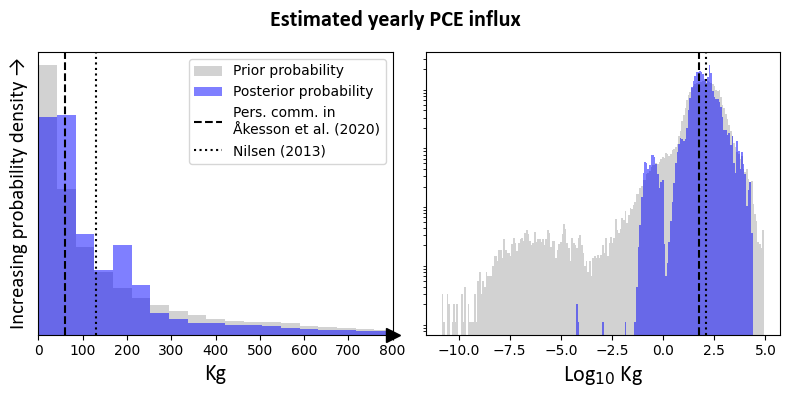

In [123]:
with plt.rc_context():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), dpi=100)

    fig.suptitle('Estimated yearly PCE influx', fontsize=16, fontfamily='Calibri', weight='bold')

    ax1.hist(ymi_pr_res[ymi_pr_res!=0], bins=binBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax1.hist(ymi_pt_res[ymi_pt_res!=0], bins=binBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    
    ax1.axvline(x=59, ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax1.axvline(x=130, ls='dotted', c='k', label='Nilsen (2013)')
    
    ax1.spines['left'].set_position('zero')
    ax1.spines['bottom'].set_position('zero')
    ax1.xaxis.set_ticks_position('bottom')
    ax1.yaxis.set_ticks_position('left')
    # make arrows
    ax1.plot((1), (0), ls="", marker=">", ms=10, color="k",
            transform=ax1.get_yaxis_transform(), clip_on=False)
    
    
    ax2.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax2.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    ax2.axvline(x=np.log10(59), ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax2.axvline(x=np.log10(130), ls='dotted', c='k', label='Nilsen (2013)')

    ax1.set_xlim([0, 800])
    #ax2.set_xlim([-2, 5])
    
    ax2.set_yscale('log')

    for ax in [ax1, ax2]:
        ax.set_yticks([])
    
    ax1.set_ylabel('Increasing probability density →', fontsize=15, fontname='Calibri') # Increasing probability density
    ax1.set_xlabel('Kg', fontsize=16, fontname='Calibri')
    ax2.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    
    ax1.legend()
    
    plt.tight_layout()
    plt.savefig(os.path.join(results_ws, 'estimated_pce_mass_influx_nolim.jpg'))
    plt.show()

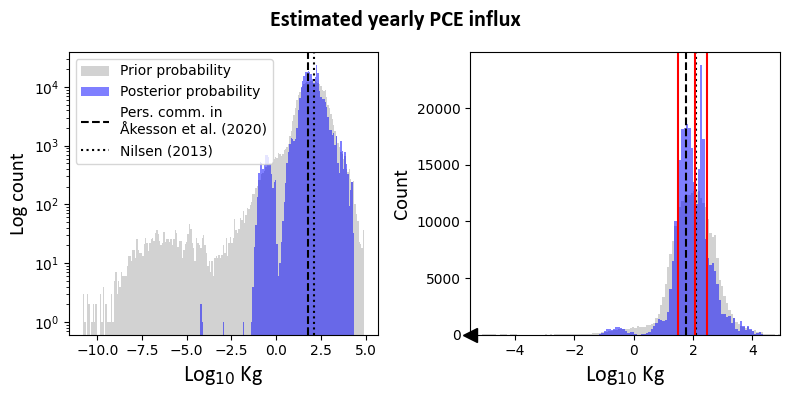

In [124]:
with plt.rc_context():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), dpi=100)

    fig.suptitle('Estimated yearly PCE influx', fontsize=16, fontfamily='Calibri', weight='bold')
    
    ax1.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax1.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    ax1.axvline(x=np.log10(59), ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax1.axvline(x=np.log10(130), ls='dotted', c='k', label='Nilsen (2013)')

    ax2.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax2.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    ax2.axvline(x=np.log10(59), ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax2.axvline(x=np.log10(130), ls='dotted', c='k', label='Nilsen (2013)')
    
    ax2.axvline(x=np.log10(30), ls='-', c='r')
    ax2.axvline(x=np.log10(120), ls='-', c='r')
    ax2.axvline(x=np.log10(300), ls='-', c='r')
    
    #ax2.spines['left'].set_position('zero')
    #ax2.spines['bottom'].set_position('zero')
    ax2.xaxis.set_ticks_position('bottom')
    ax2.yaxis.set_ticks_position('left')
    # make arrows
    ax2.plot((0), (0), ls="", marker="<", ms=10, color="k",
            transform=ax2.get_yaxis_transform(), clip_on=False)
    
    ax2.set_xlim([-5.5, 4.93])
    
    ax1.set_yscale('log')

    #ax1.set_yticks([])
    
    ax2.set_ylabel('Count', fontsize=15, fontname='Calibri') # Increasing probability density →
    ax1.set_ylabel('Log count', fontsize=15, fontname='Calibri') # Increasing probability density
    ax2.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    ax1.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    
    ax1.legend()
    
    plt.tight_layout()
    plt.savefig(os.path.join(results_ws, 'estimated_pce_mass_influx_nolim.jpg'))
    plt.show()

In [125]:
np.log10(x).max()

4.925438850597364

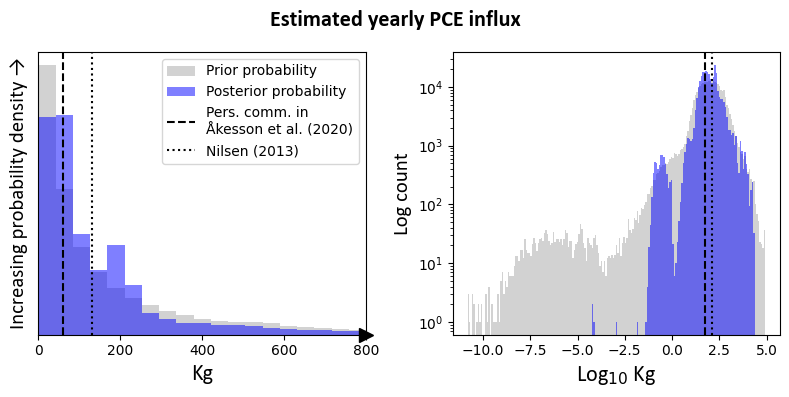

In [126]:
with plt.rc_context():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), dpi=100)

    fig.suptitle('Estimated yearly PCE influx', fontsize=16, fontfamily='Calibri', weight='bold')

    ax1.hist(ymi_pr_res[ymi_pr_res!=0], bins=binBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax1.hist(ymi_pt_res[ymi_pt_res!=0], bins=binBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    
    ax1.axvline(x=59, ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax1.axvline(x=130, ls='dotted', c='k', label='Nilsen (2013)')
    
    ax1.spines['left'].set_position('zero')
    ax1.spines['bottom'].set_position('zero')
    ax1.xaxis.set_ticks_position('bottom')
    ax1.yaxis.set_ticks_position('left')
    # make arrows
    ax1.plot((1), (0), ls="", marker=">", ms=10, color="k",
            transform=ax1.get_yaxis_transform(), clip_on=False)
    
    
    ax2.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey', label='Prior probability')
    ax2.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue', label='Posterior probability')
    ax2.axvline(x=np.log10(59), ls='--', c='k', label='Pers. comm. in\nÅkesson et al. (2020)')
    ax2.axvline(x=np.log10(130), ls='dotted', c='k', label='Nilsen (2013)')

    ax1.set_xlim([0, 800])
    #ax2.set_xlim([-2, 5])
    
    ax2.set_yscale('log')

    ax1.set_yticks([])
    
    ax1.set_ylabel('Increasing probability density →', fontsize=15, fontname='Calibri') # Increasing probability density
    ax2.set_ylabel('Log count', fontsize=15, fontname='Calibri') # Increasing probability density
    ax1.set_xlabel('Kg', fontsize=16, fontname='Calibri')
    ax2.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    
    ax1.legend()
    
    plt.tight_layout()
    plt.savefig(os.path.join(results_ws, 'estimated_pce_mass_influx_nolim.jpg'))
    plt.show()

In [127]:
np.nanmean(dmiptrs_flat[dmiptrs_flat!=0])

0.8459360933342847

In [128]:
imd_df

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
0,2016-02-26,14,156,NI15-Ö34,Regular,19022.277381,2152.722080,25126.563960,22948.557360,3272.440090,451.790082,4338.985896,2002.842535,380.0,18.150516,7.252173,0.879346,9.528193,8.736310
1,2016-02-26,14,94,NI15-Ö29,Regular,16128.750955,2198.265204,22205.996399,23203.578184,25.514824,52.023943,441.337539,708.135384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,2016-02-26,14,150,NI15-Ö33,Regular,19256.796021,2174.399717,25347.081600,23299.097713,3196.660596,442.111437,4153.452983,1925.792870,18.0,0.937410,0.346268,0.044781,0.456992,0.422144
3,2016-02-26,14,157,NI15-Ö35,Regular,19097.474474,2153.356654,25301.148864,22998.849274,3352.819112,459.747630,4504.105327,2077.909579,17.0,0.836079,0.322561,0.039142,0.432146,0.393280
4,2016-02-26,14,132,NI15-Ö32,Regular,18160.204722,2169.512615,23678.297528,23255.160926,2024.326907,400.823085,2134.988809,1468.155343,15.0,0.735211,0.272242,0.034706,0.357824,0.350769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,2018-11-09,154,163,S6,Regular,11171.766724,1225.523202,20082.481899,20810.028208,3595.937198,466.095807,5138.597286,2384.743968,14.0,0.700153,0.156143,0.018009,0.280657,0.293197
624,2018-11-09,154,80,S2,Regular,8120.624579,1202.911896,16470.310018,20688.366181,9.200608,35.266023,267.205924,548.121413,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
625,2018-11-09,154,150,S5,Regular,10923.402381,1234.689890,19297.409180,20829.261516,3066.608804,423.277608,3868.450827,1938.589612,30.0,1.535685,0.327462,0.041216,0.579101,0.626100
626,2019-10-15,202,178,S7,High,53231.056701,1859.662632,50055.849202,28436.481311,3872.862358,618.462547,6122.290563,2735.031114,2.3,0.107754,0.122731,0.007303,0.115354,0.065893


In [129]:
ts14 = imd_df.loc[imd_df.timestep == '14'].sort_values(by='sfr_cell')
ts14

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
16,2016-02-26,14,27,NI15-Ö26,Regular,18194.599175,2243.949670,25188.535284,23600.722768,0.000000,0.000000,0.426890,9.430300,0.0,0.000000,NaN,NaN,0.000000,NaN
11,2016-02-26,14,81,NI15-Ö28,Regular,16274.684039,2189.161670,22290.167888,23208.930858,15.334545,43.240485,305.105445,568.460644,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
8,2016-02-26,14,88,NI15-Ö28A,Regular,16127.006068,2196.153100,22135.046246,23200.882534,16.917365,45.560580,353.377253,635.439630,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,2016-02-26,14,94,NI15-Ö29,Regular,16128.750955,2198.265204,22205.996399,23203.578184,25.514824,52.023943,441.337539,708.135384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
6,2016-02-26,14,107,NI15-Ö30,Regular,16856.917546,2193.856681,22699.512025,23255.047905,701.589537,236.736350,1077.763556,1041.967482,6.7,0.320128,0.113026,0.015537,0.159701,0.157207
10,2016-02-26,14,111,NI16-Ö13,Regular,17334.659113,2194.673761,22982.273260,23271.332657,1161.625648,290.506460,1351.607115,1155.289345,45.0,2.169783,0.781215,0.104490,1.064322,1.047272
15,2016-02-26,14,121,NI15-Ö31,Regular,17502.818577,2179.093169,23112.890648,23153.426405,1424.881920,338.072852,1621.957694,1285.192932,15.0,0.670482,0.262443,0.035095,0.353310,0.352468
14,2016-02-26,14,129,NI16-Ö11,Regular,17957.272866,2172.857394,23455.611509,23199.630997,1763.756514,366.806143,1882.192946,1363.970398,77.0,4.084216,1.385439,0.184800,1.828959,1.793547
4,2016-02-26,14,132,NI15-Ö32,Regular,18160.204722,2169.512615,23678.297528,23255.160926,2024.326907,400.823085,2134.988809,1468.155343,15.0,0.735211,0.272242,0.034706,0.357824,0.350769
2,2016-02-26,14,150,NI15-Ö33,Regular,19256.796021,2174.399717,25347.081600,23299.097713,3196.660596,442.111437,4153.452983,1925.792870,18.0,0.937410,0.346268,0.044781,0.456992,0.422144


In [130]:
imd_df

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
0,2016-02-26,14,156,NI15-Ö34,Regular,19022.277381,2152.722080,25126.563960,22948.557360,3272.440090,451.790082,4338.985896,2002.842535,380.0,18.150516,7.252173,0.879346,9.528193,8.736310
1,2016-02-26,14,94,NI15-Ö29,Regular,16128.750955,2198.265204,22205.996399,23203.578184,25.514824,52.023943,441.337539,708.135384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,2016-02-26,14,150,NI15-Ö33,Regular,19256.796021,2174.399717,25347.081600,23299.097713,3196.660596,442.111437,4153.452983,1925.792870,18.0,0.937410,0.346268,0.044781,0.456992,0.422144
3,2016-02-26,14,157,NI15-Ö35,Regular,19097.474474,2153.356654,25301.148864,22998.849274,3352.819112,459.747630,4504.105327,2077.909579,17.0,0.836079,0.322561,0.039142,0.432146,0.393280
4,2016-02-26,14,132,NI15-Ö32,Regular,18160.204722,2169.512615,23678.297528,23255.160926,2024.326907,400.823085,2134.988809,1468.155343,15.0,0.735211,0.272242,0.034706,0.357824,0.350769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,2018-11-09,154,163,S6,Regular,11171.766724,1225.523202,20082.481899,20810.028208,3595.937198,466.095807,5138.597286,2384.743968,14.0,0.700153,0.156143,0.018009,0.280657,0.293197
624,2018-11-09,154,80,S2,Regular,8120.624579,1202.911896,16470.310018,20688.366181,9.200608,35.266023,267.205924,548.121413,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
625,2018-11-09,154,150,S5,Regular,10923.402381,1234.689890,19297.409180,20829.261516,3066.608804,423.277608,3868.450827,1938.589612,30.0,1.535685,0.327462,0.041216,0.579101,0.626100
626,2019-10-15,202,178,S7,High,53231.056701,1859.662632,50055.849202,28436.481311,3872.862358,618.462547,6122.290563,2735.031114,2.3,0.107754,0.122731,0.007303,0.115354,0.065893


In [131]:
def plot_reaches_mass_influx():
    # Data
    x = [i for i in range(1, 264)]
    
    # Figure settings
    fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=100)
    
    fig.suptitle('Upstream PCE influx computed at sample point', fontsize=16, fontfamily='Calibri', weight='bold')
    
    label_colors = ['green', 'red', 'blue']
    
    for regime, label_color in zip(imd_df.flow_regime.unique(), label_colors):
        ax.errorbar(imd_df.loc[imd_df.flow_regime == regime].sfr_cell, imd_df.loc[imd_df.flow_regime == regime].daily_mass_pt_influx_mean,
                    yerr=imd_df.loc[imd_df.flow_regime == regime].daily_mass_pt_influx_stdev * 2, alpha=0.25,
                    color=label_color, fmt='o', label=f'{regime} flow', 
                   markeredgewidth=0)
    
    plt.axhline(y=0, c='k', linestyle='--', linewidth=1, alpha=0.5)
    
    # Reaches
    plt.axvline(x=31, c='k', linestyle='--', lw=1, alpha=0.5) # reach 1
    plt.axvline(x=47, c='k', linestyle='--', lw=1, alpha=0.5) # reach 2
    plt.axvline(x=71, c='k', linestyle='--', lw=1, alpha=0.5) # reach 3
    plt.axvline(x=91, c='k', linestyle='--', lw=1, alpha=0.5) # reach 4
    plt.axvline(x=121, c='k', linestyle='--', lw=1, alpha=0.5) # reach 5
    plt.axvline(x=138, c='k', linestyle='--', lw=1, alpha=0.5) # reach 6
    plt.axvline(x=151, c='k', linestyle='--', lw=1, alpha=0.5) # reach 7
    plt.axvline(x=155, c='k', linestyle='--', lw=1, alpha=0.5) # reach 8
    plt.axvline(x=161, c='k', linestyle='--', lw=1, alpha=0.5) # reach 9
    plt.axvline(x=186, c='k', linestyle='--', lw=1, alpha=0.5) # reach 10
    plt.axvline(x=226, c='k', linestyle='--', lw=1, alpha=0.5) # reach 11
    
    plt.xlim((0, 264))
    #plt.ylim((-0, 50))
    plt.ylabel('$Kg/d$', fontsize=16, fontname='Calibri')
    ax.set_yscale('log')
    
    # reach text
    plt.text(15, 2e-4, 'r1', fontsize=12)
    plt.text(38, 2e-4, 'r2', fontsize=12)
    plt.text(58, 2e-4, 'r3', fontsize=12)
    plt.text(79, 2e-4, 'r4', fontsize=12, alpha=0.7)
    plt.text(105, 2e-4, 'r5', fontsize=12)
    plt.text(128, 2e-4, 'r6', fontsize=12)
    plt.text(143, 2e-4, 'r7', fontsize=12)
    plt.text(151.6, 2e-4, 'r8', fontsize=9, rotation=90)
    plt.text(156.2, 2e-4, 'r9', fontsize=11, rotation=90)
    plt.text(169, 2e-4, 'r10', fontsize=12)
    plt.text(202, 2e-4, 'r11', fontsize=12)
    plt.text(242, 2e-4, 'r12', fontsize=12)
    
    # Recharge, Discharge text
    #plt.text(267, 500, 'Recharge', fontsize=16, fontname='Calibri', rotation=90)
    #plt.text(267, -1800, 'Discharge', fontsize=16, fontname='Calibri', rotation=90)
    
    plt.yticks(fontsize=14, fontname='Calibri')
    
    ax.grid(which='major', axis='y', linestyle='dashed', alpha=0.5)
    ax.grid(which='minor', axis='y', linestyle='dashed', alpha=0.1)
    ax.set_axisbelow(True)
    
    plt.legend(prop={'size': 16, 'family': 'Calibri'})
    plt.tight_layout()
    
    plt.gca().axes.get_xaxis().set_visible(False)
    #plt.savefig(os.path.join(results_ws, 'reaches_flux.png'))

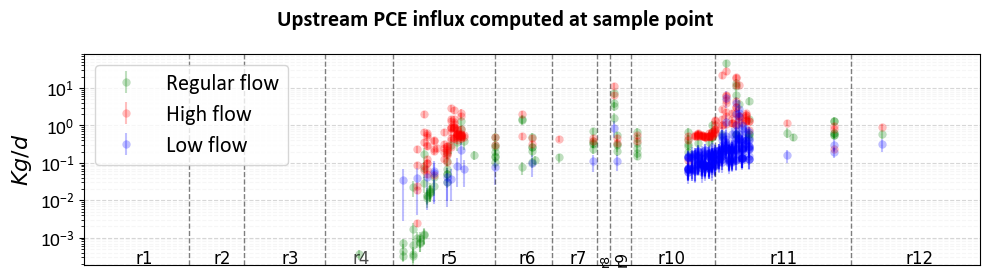

In [132]:
plot_reaches_mass_influx()

In [133]:
flux_reach_pt_nb.T

,5,29,36,48,64,99,136,178,200,202,...,487,488,489,491,492,494,495,496,497,498
lk-1_1,1107.5240,506.8681,405.7121,540.6872,335.9683,393.3712,515.8425,946.0769,629.5076,443.0590,...,225.7992,492.3871,546.4643,592.0397,400.7760,306.9577,464.1815,399.0041,485.5844,417.14450
lk-1_2,1128.2490,522.4796,407.4821,552.5956,343.4716,397.7403,519.5638,949.6398,651.2252,472.6905,...,234.4272,506.1558,561.5981,596.8475,409.8428,305.8857,478.5394,418.4179,497.4636,427.56110
lk-1_3,1131.8450,524.8597,411.7190,557.8568,346.9288,400.5973,521.5699,956.0144,660.0190,478.2419,...,237.6971,516.1972,568.1500,597.3250,413.9653,308.4640,482.3026,424.4864,500.9600,429.61630
lk-1_4,1122.1150,519.9821,406.9417,555.5922,343.9218,401.3875,518.4635,944.6005,645.7051,465.5157,...,233.9986,503.6443,560.0605,597.8494,411.2982,309.6142,474.0946,419.3783,499.6567,427.01380
lk-1_5,1090.8860,507.2238,395.6340,545.3766,335.9856,394.2044,510.9906,933.1257,628.4272,446.0421,...,225.7576,478.9821,543.3350,590.3066,403.0518,308.7531,460.0085,407.6708,487.9182,418.95610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
lk-263_209,-826.5703,-269.9344,-150.4281,-164.2711,-311.8275,-373.4055,-566.2115,-262.3806,-141.3336,-166.8507,...,-438.9200,-275.3745,-340.6560,-139.9036,-219.6970,-368.2483,-244.1075,-249.0371,-475.4461,-69.41647
lk-263_210,-806.5696,-235.2109,-135.3557,-139.6901,-301.4927,-348.6896,-568.3571,-245.6453,-129.5221,-169.0228,...,-429.0457,-258.5138,-323.5478,-134.8820,-204.3191,-362.8463,-244.2154,-242.0210,-464.2889,-58.04457
lk-263_211,-844.2895,-270.6375,-153.3282,-161.1149,-320.3252,-377.5422,-584.9382,-267.7322,-143.5247,-173.3347,...,-444.5656,-280.4241,-347.0174,-148.7049,-219.0164,-374.7891,-252.6132,-251.2414,-481.9096,-69.45257
lk-263_212,-843.2637,-273.8285,-153.5105,-163.8816,-321.0327,-383.7785,-585.4307,-268.3782,-144.3517,-172.1349,...,-441.7974,-277.6019,-347.7146,-148.6685,-217.5530,-373.6801,-252.5119,-250.6646,-484.2302,-70.13042


In [134]:
of_reach_pt_nb.T.loc[of_reach_pt_nb.T.index.str.contains(f'-{sfr_cell}_')].iloc[5:]

,5,29,36,48,64,99,136,178,200,202,...,487,488,489,491,492,494,495,496,497,498
of-221_6,-16439.74,-18786.86,-20291.70,-18413.12,-15201.43,-21717.95,-19725.11,-17482.61,-20497.14,-19632.39,...,-17182.76,-14905.05,-18939.34,-16727.35,-17417.68,-18388.96,-18588.16,-16751.68,-20969.38,-20439.95
of-221_7,-19716.15,-20944.35,-19939.39,-22597.72,-21779.27,-19524.24,-20200.14,-20910.46,-18663.01,-19994.56,...,-18276.67,-17856.05,-19719.43,-19826.94,-21137.02,-20309.72,-20744.21,-21483.29,-22881.90,-20621.27
of-221_8,-27305.26,-30720.13,-27760.89,-30579.81,-27858.73,-26805.42,-25965.53,-31461.21,-32421.38,-31974.55,...,-25254.84,-30494.87,-28038.30,-30582.96,-28550.38,-27701.80,-28438.02,-31147.55,-28278.88,-28277.11
of-221_9,-13046.70,-13409.46,-16101.93,-11382.36,-14445.65,-14960.51,-16778.86,-13180.27,-16056.92,-15261.98,...,-13348.31,-12923.19,-16487.25,-12085.38,-11096.95,-13360.34,-17196.97,-14372.87,-18134.94,-18962.16
of-221_10,-29527.59,-34992.49,-30434.46,-30245.87,-28190.26,-31300.32,-25792.76,-29449.47,-35104.68,-28289.37,...,-26501.41,-30166.54,-27325.56,-33441.21,-25642.95,-28994.12,-31442.61,-26111.77,-36243.10,-31322.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
of-221_209,-35821.91,-35790.39,-35021.98,-34269.89,-33822.65,-33769.74,-34415.15,-34849.77,-36500.69,-38865.77,...,-34436.36,-32770.80,-33164.86,-32919.87,-29529.90,-34267.02,-35141.52,-34560.83,-36152.58,-36428.44
of-221_210,-77218.55,-78345.98,-77554.23,-76049.71,-74037.03,-75565.28,-77916.09,-76332.52,-79462.84,-73674.52,...,-76956.46,-74155.33,-74942.18,-73638.34,-80126.93,-75691.62,-74761.32,-77539.68,-77371.78,-76758.13
of-221_211,-43352.30,-44200.68,-43459.97,-45947.48,-44381.59,-44845.40,-43985.89,-43075.56,-45299.62,-44997.08,...,-44102.01,-43329.22,-43454.39,-41901.07,-43026.50,-42537.43,-46580.73,-45891.42,-47399.72,-43437.50
of-221_212,-42312.46,-39498.59,-41619.10,-38316.03,-39493.82,-36535.25,-40684.17,-39702.51,-40197.74,-39958.54,...,-40708.90,-40044.78,-40305.27,-40121.29,-42559.05,-38347.59,-42355.62,-38945.75,-36710.51,-41097.60


In [135]:
tfrl_df = timestep_flow_regime_labels_df
tfrl_df.head()

,timestep,flow_regime
0,1,Regular
1,2,High
2,3,Regular
3,4,Regular
4,5,Regular


In [136]:
regular_flow_ts = tfrl_df.loc[tfrl_df.flow_regime == 'Regular', 'timestep'].values
high_flow_ts = tfrl_df.loc[tfrl_df.flow_regime == 'High', 'timestep'].values
low_flow_ts = tfrl_df.loc[tfrl_df.flow_regime == 'Low', 'timestep'].values

In [137]:
regular_flow_idx = []
for ts in regular_flow_ts:
    if ts > 5:
        for cell in range(1, 264):
            regular_flow_idx.append(f'lk-{cell}_{ts}')

high_flow_idx = []
for ts in high_flow_ts:
    if ts > 5:
        for cell in range(1, 264):
            high_flow_idx.append(f'lk-{cell}_{ts}')

low_flow_idx = []
for ts in low_flow_ts:
    if ts > 5:
        for cell in range(1, 264):
            low_flow_idx.append(f'lk-{cell}_{ts}')

In [138]:
regular_flow_flux_df = flux_reach_pt_nb.T.loc[flux_reach_pt_nb.T.index.isin(regular_flow_idx)]
high_flow_flux_df = flux_reach_pt_nb.T.loc[flux_reach_pt_nb.T.index.isin(high_flow_idx)]
low_flow_flux_df = flux_reach_pt_nb.T.loc[flux_reach_pt_nb.T.index.isin(low_flow_idx)]
rff_df = regular_flow_flux_df
hff_df = high_flow_flux_df
lff_df = low_flow_flux_df
rff_df

,5,29,36,48,64,99,136,178,200,202,...,487,488,489,491,492,494,495,496,497,498
lk-1_6,1108.2730,513.8150,403.9938,552.0771,339.9874,401.0106,515.5649,941.7094,642.3970,460.1453,...,230.7849,491.9591,554.0375,593.5417,408.0983,310.9717,470.6769,413.2008,495.9446,423.58190
lk-1_8,1117.2100,518.0571,407.5920,556.0273,344.3886,402.2458,515.9725,951.4281,650.4286,470.0709,...,233.5224,509.2971,559.0212,595.5433,412.3710,311.5201,477.8746,420.1710,500.1909,424.33610
lk-1_9,1103.5220,509.2021,403.2684,546.5616,339.0107,399.7101,513.7421,938.2700,636.3865,453.2318,...,228.2582,487.8595,550.8004,590.8874,405.7746,310.7479,469.2079,410.3222,496.2610,421.72150
lk-1_11,1116.8790,512.8422,405.9456,553.6763,344.9450,402.2018,514.3461,950.7934,646.5300,471.2213,...,235.3017,509.3414,559.0953,589.2516,414.2025,309.9673,481.4870,418.8239,502.3361,423.04670
lk-1_15,1101.6540,500.1193,400.8621,543.9380,337.9941,399.2266,508.4191,936.7701,625.2334,450.0522,...,226.5992,485.5346,544.1912,582.8584,408.8291,309.9093,466.1357,404.1222,495.0121,415.30430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
lk-263_194,-814.2662,-288.8099,-153.4184,-174.7267,-305.5257,-373.8228,-546.9086,-265.0664,-144.4742,-155.8066,...,-421.4317,-260.2514,-340.0173,-129.3317,-215.2816,-351.8080,-234.6188,-243.4128,-463.4343,-78.35256
lk-263_196,-811.3948,-285.6266,-151.9130,-173.3826,-304.4815,-373.0272,-544.5178,-261.0855,-142.3917,-156.4629,...,-421.7765,-259.8246,-338.3105,-127.9521,-216.0651,-352.2614,-234.0087,-243.2031,-462.5439,-75.70853
lk-263_204,-833.5699,-284.2563,-154.6777,-172.7583,-313.6435,-379.9996,-562.6926,-268.2729,-145.9960,-165.7738,...,-438.3867,-276.7726,-345.2925,-139.3975,-222.5577,-368.4018,-243.2864,-251.4083,-477.2279,-74.22466
lk-263_205,-836.5449,-292.0892,-159.3046,-179.4006,-314.7453,-387.2622,-559.4521,-273.0273,-149.3079,-162.8949,...,-439.8480,-279.6938,-348.4018,-139.5668,-224.0204,-367.6458,-241.7228,-251.5976,-478.1774,-78.23777


In [139]:
ffu = [] # flow regime flux uncertainty
for i in range(1, 264):
    rff = rff_df.loc[rff_df.index.str.contains(f'lk-{i}_')]
    hff = hff_df.loc[hff_df.index.str.contains(f'lk-{i}_')]
    lff = lff_df.loc[lff_df.index.str.contains(f'lk-{i}_')]
    
    ffu.append({
        'regular_flow_high_unc': rff.max().max(),
        'regular_flow_low_unc': rff.min().min(),
        'regular_flow_mean_unc': rff.mean().mean(),
        'high_flow_high_unc': hff.max().max(),
        'high_flow_low_unc': hff.min().min(),
        'high_flow_mean_unc': rff.mean().mean(),
        'low_flow_high_unc': lff.max().max(),
        'low_flow_low_unc': lff.min().min(),
        'low_flow_mean_unc': rff.mean().mean(),
    })

<AxesSubplot:>

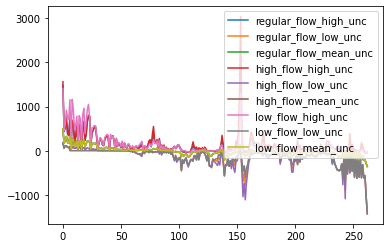

In [140]:
ffu_df = pd.DataFrame(ffu)
ffu_df.plot()

In [141]:
imd_df

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
0,2016-02-26,14,156,NI15-Ö34,Regular,19022.277381,2152.722080,25126.563960,22948.557360,3272.440090,451.790082,4338.985896,2002.842535,380.0,18.150516,7.252173,0.879346,9.528193,8.736310
1,2016-02-26,14,94,NI15-Ö29,Regular,16128.750955,2198.265204,22205.996399,23203.578184,25.514824,52.023943,441.337539,708.135384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,2016-02-26,14,150,NI15-Ö33,Regular,19256.796021,2174.399717,25347.081600,23299.097713,3196.660596,442.111437,4153.452983,1925.792870,18.0,0.937410,0.346268,0.044781,0.456992,0.422144
3,2016-02-26,14,157,NI15-Ö35,Regular,19097.474474,2153.356654,25301.148864,22998.849274,3352.819112,459.747630,4504.105327,2077.909579,17.0,0.836079,0.322561,0.039142,0.432146,0.393280
4,2016-02-26,14,132,NI15-Ö32,Regular,18160.204722,2169.512615,23678.297528,23255.160926,2024.326907,400.823085,2134.988809,1468.155343,15.0,0.735211,0.272242,0.034706,0.357824,0.350769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,2018-11-09,154,163,S6,Regular,11171.766724,1225.523202,20082.481899,20810.028208,3595.937198,466.095807,5138.597286,2384.743968,14.0,0.700153,0.156143,0.018009,0.280657,0.293197
624,2018-11-09,154,80,S2,Regular,8120.624579,1202.911896,16470.310018,20688.366181,9.200608,35.266023,267.205924,548.121413,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
625,2018-11-09,154,150,S5,Regular,10923.402381,1234.689890,19297.409180,20829.261516,3066.608804,423.277608,3868.450827,1938.589612,30.0,1.535685,0.327462,0.041216,0.579101,0.626100
626,2019-10-15,202,178,S7,High,53231.056701,1859.662632,50055.849202,28436.481311,3872.862358,618.462547,6122.290563,2735.031114,2.3,0.107754,0.122731,0.007303,0.115354,0.065893


In [142]:
imd_df.loc[(imd_df.sfr_cell < 121) & (imd_df.flow_regime == 'Low')]
# at low flows, flow standard deviation in upstream reaches are relatively high (one third)
# causing high uncertainty in calculated upstream pce influx

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
307,2017-08-28,92,103,NI17-Ö3,Low,3483.180953,1475.491225,9285.927728,14242.217992,226.064500,169.319226,594.934416,875.343322,15.0,0.743812,0.052554,0.022344,0.152265,0.216507
308,2017-08-28,92,107,NI15-Ö30,Low,3838.516193,1482.687949,9505.872800,14301.033980,655.376726,223.269736,889.969452,1041.047377,7.9,0.377421,0.030322,0.011764,0.081202,0.115010
316,2017-08-29,92,94,NI15-Ö29,Low,3158.726404,1457.138796,9092.693920,14220.344948,19.562588,45.981422,348.329272,672.017353,11.0,0.540573,0.034682,0.015975,0.116142,0.164885
322,2017-08-29,92,107,NI15-Ö30,Low,3838.516193,1482.687949,9505.872800,14301.033980,655.376726,223.269736,889.969452,1041.047377,11.0,0.525942,0.042138,0.016235,0.114421,0.163442
325,2017-08-29,92,110,NI17-Ö5,Low,4212.317313,1489.717535,9700.588470,14342.137425,964.576427,259.367239,1054.929986,1120.806155,19.0,0.945690,0.080151,0.028852,0.194417,0.280123
326,2017-08-29,92,111,NI16-Ö13,Low,4311.424342,1491.004119,9756.755179,14348.272783,1095.584608,275.038997,1127.357659,1153.071015,50.0,2.440986,0.216467,0.075963,0.512362,0.728518
327,2017-08-29,92,98,NI17-Ö1,Low,3213.631721,1461.236297,9167.901883,14222.212194,73.747488,79.804222,451.605051,759.455719,12.0,0.604539,0.038641,0.017323,0.119468,0.169179
330,2017-08-29,92,112,NI17-Ö6,Low,4385.691327,1491.244626,9799.671891,14345.476909,1194.707271,285.308783,1184.302511,1176.608106,16.0,0.777395,0.070115,0.024061,0.163437,0.235269
331,2017-08-29,92,101,NI17-Ö2,Low,3306.815157,1473.659334,9206.666646,14232.613914,152.709745,132.671871,533.514657,823.898758,13.0,0.605864,0.043183,0.018919,0.131608,0.188778
332,2017-08-29,92,103,NI17-Ö3,Low,3483.180953,1475.491225,9285.927728,14242.217992,226.064500,169.319226,594.934416,875.343322,17.0,0.866802,0.059555,0.025182,0.172423,0.246821


In [143]:
imd_df.loc[(imd_df.sfr_cell < 121) & (imd_df.flow_regime == 'High')]
# at high flows, flow standard deviation in upstream reaches are relatively low (one tenth)
# causing low uncertainty in calculated upstream pce influx

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
55,2016-11-21,52,27,NI15-Ö26,High,24300.253918,2298.028071,30696.892554,26859.622301,0.000000,0.000000,0.736962,13.729236,0.0,0.000000,NaN,NaN,0.000000,0.000000
57,2016-11-21,52,88,NI15-Ö28A,High,22141.582887,2266.072336,27420.585416,26448.449918,13.150355,40.532004,362.109522,646.484036,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
59,2016-11-21,52,88,NI15-Ö28B,High,22141.582887,2266.072336,27420.585416,26448.449918,13.150355,40.532004,362.109522,646.484036,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
65,2016-11-21,52,94,NI15-Ö29,High,22139.500165,2268.998727,27491.807259,26451.532421,20.528438,46.615501,451.400949,716.185197,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
66,2016-11-21,52,111,NI16-Ö13,High,23293.895732,2300.535957,28258.913083,26539.844379,1114.258650,284.112188,1372.453347,1183.841829,95.0,4.284582,2.214495,0.245348,2.771272,2.531216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251,2017-05-15,77,101,U1a-10,High,25423.481340,2279.522699,30767.087058,26809.882835,180.587841,144.615158,706.041411,891.479646,2.6,0.134413,0.066279,0.006819,0.083551,0.068960
252,2017-05-15,77,101,U1a-13,High,25423.481340,2279.522699,30767.087058,26809.882835,180.587841,144.615158,706.041411,891.479646,5.1,0.256289,0.129777,0.013226,0.164819,0.137078
253,2017-05-15,77,101,U1a-08,High,25423.481340,2279.522699,30767.087058,26809.882835,180.587841,144.615158,706.041411,891.479646,3.9,0.198630,0.099471,0.010164,0.126154,0.105311
254,2017-05-15,77,101,U1a-12,High,25423.481340,2279.522699,30767.087058,26809.882835,180.587841,144.615158,706.041411,891.479646,12.0,0.592916,0.305332,0.031255,0.385681,0.319936


In [144]:
imd_df.loc[imd_df.flow_regime == 'Low']

,sample_date,timestep,sfr_cell,sample_site,flow_regime,flows_pt_mean,flows_pt_stdev,flows_pr_mean,flows_pr_stdev,upstream_pt_influx_mean,upstream_pt_influx_stdev,upstream_pr_influx_mean,upstream_pr_influx_stdev,concentration_mean,concentration_stdev,daily_mass_pt_influx_mean,daily_mass_pt_influx_stdev,daily_mass_pr_influx_mean,daily_mass_pr_influx_stdev
307,2017-08-28,92,103,NI17-Ö3,Low,3483.180953,1475.491225,9285.927728,14242.217992,226.064500,169.319226,594.934416,875.343322,15.0,0.743812,0.052554,0.022344,0.152265,0.216507
308,2017-08-28,92,107,NI15-Ö30,Low,3838.516193,1482.687949,9505.872800,14301.033980,655.376726,223.269736,889.969452,1041.047377,7.9,0.377421,0.030322,0.011764,0.081202,0.115010
309,2017-08-29,92,157,NI15-Ö35,Low,6272.285142,1459.699967,12189.597173,14290.456395,3295.415968,435.077749,4016.568916,1868.964359,18.0,0.906490,0.112737,0.026965,0.218722,0.256005
310,2017-08-29,92,184,NI17-Ö8,Low,6616.633153,1454.600608,13006.030486,14418.898199,3762.321032,474.450427,5169.794365,2185.613651,23.0,1.179109,0.151827,0.034390,0.300940,0.335659
311,2017-08-29,92,156,NI15-Ö34,Low,6224.623021,1457.555756,12056.204030,14266.591879,3241.466445,432.287754,3885.071984,1835.807559,140.0,7.137952,0.871532,0.207541,1.682750,1.995342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2018-05-16,129,184,U3-120_3,Low,6806.546666,1656.198484,11547.796267,13668.451411,3863.820629,482.282084,5100.388881,2088.069988,12.0,0.588714,0.081583,0.020140,0.138459,0.164162
607,2018-05-16,129,184,U3-48_3,Low,6806.546666,1656.198484,11547.796267,13668.451411,3863.820629,482.282084,5100.388881,2088.069988,11.0,0.556222,0.074896,0.018732,0.126961,0.150872
608,2018-05-16,129,185,U3-46_3,Low,6824.671794,1654.094656,11573.652066,13667.637130,3874.737684,482.696787,5121.671440,2091.382717,14.0,0.685935,0.095925,0.023893,0.162465,0.196432
609,2018-11-01,153,178,S7,Low,4841.233144,912.707089,12085.439266,14295.280681,3655.984213,464.800021,5047.971912,2282.879281,12.0,0.621359,0.058113,0.011535,0.145273,0.171871


(array([  2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  26., 172.]),
 array([1856.33814311, 1902.68819667, 1949.03825023, 1995.38830378,
        2041.73835734, 2088.0884109 , 2134.43846445, 2180.78851801,
        2227.13857157, 2273.48862512, 2319.83867868]),
 <BarContainer object of 10 artists>)

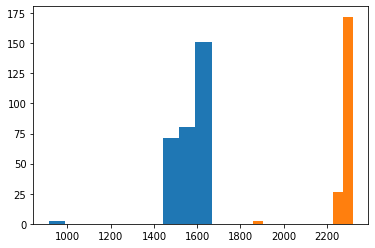

In [145]:
plt.hist(imd_df.loc[imd_df.flow_regime == 'Low'].flows_pt_stdev)
plt.hist(imd_df.loc[imd_df.flow_regime == 'High'].flows_pt_stdev)

(array([  2.,  26., 178.,  85.,   1.,   1.,   3.,   3.,   2.,   3.]),
 array([0.14443571, 0.17612272, 0.20780972, 0.23949673, 0.27118374,
        0.30287075, 0.33455776, 0.36624477, 0.39793178, 0.42961879,
        0.4613058 ]),
 <BarContainer object of 10 artists>)

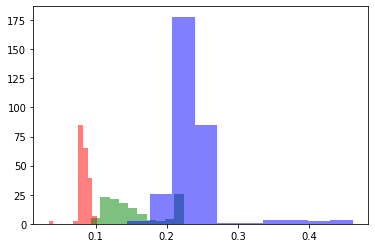

In [146]:
# Coefficient of variation
plt.hist(imd_df.loc[imd_df.flow_regime == 'High'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'High'].flows_pt_mean, alpha=0.5, color='red')
plt.hist(imd_df.loc[imd_df.flow_regime == 'Regular'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'Regular'].flows_pt_mean, alpha=0.5, color='green')
plt.hist(imd_df.loc[imd_df.flow_regime == 'Low'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'Low'].flows_pt_mean, alpha=0.5, color='blue')

In [147]:
# Mean coefficients of variation
high_coef_var = (imd_df.loc[imd_df.flow_regime == 'High'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'High'].flows_pt_mean).mean()
regular_coef_var = (imd_df.loc[imd_df.flow_regime == 'Regular'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'Regular'].flows_pt_mean).mean()
low_coef_var = (imd_df.loc[imd_df.flow_regime == 'Low'].flows_pt_stdev / imd_df.loc[imd_df.flow_regime == 'Low'].flows_pt_mean).mean()

print(f'Mean coefficient of variation during high flow: {round(high_coef_var, 4)}')
print(f'Mean coefficient of variation during regular flow: {round(regular_coef_var, 4)}')
print(f'Mean coefficient of variation during low flow: {round(low_coef_var, 4)}')

Mean coefficient of variation during high flow: 0.0846
Mean coefficient of variation during regular flow: 0.1544
Mean coefficient of variation during low flow: 0.2335


In [148]:
from matplotlib.legend_handler import HandlerBase

def plot_reaches_flow_regimes():
    
    x = [i for i in range(1, 264)]
    
    # Figure settings
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), dpi=1200)
    
    plt.rcParams['ytick.labelsize'] = 14
    
    ax2.plot(x, ffu_df.regular_flow_high_unc, color='green', alpha=0.65, label='Upper uncertainty bound', lw=1.)
    ax2.plot(x, ffu_df.regular_flow_low_unc, color='green', alpha=0.65, label='Lower uncertainty bound', lw=1., linestyle='-.')
    
    ax2.plot(x, ffu_df.high_flow_high_unc, color='red', alpha=0.65, lw=1.)
    ax2.plot(x, ffu_df.high_flow_low_unc, color='red', alpha=0.65, lw=1.5, linestyle='-.')
    
    ax2.plot(x, ffu_df.low_flow_high_unc, color='blue', alpha=0.65, lw=1.)
    ax2.plot(x, ffu_df.low_flow_low_unc, color='blue', alpha=0.65, lw=1., linestyle='-.')
    
    label_colors = ['green', 'red', 'blue']
    
    ax1.axhline(y=geom_mean_pce, c='k', label='Geometric mean', ls='--', lw=2., alpha=0.75)
    
    for regime, label_color in zip(imd_df.flow_regime.unique(), label_colors):
        ax1.errorbar(imd_df.loc[imd_df.flow_regime == regime].sfr_cell, imd_df.loc[imd_df.flow_regime == regime].daily_mass_pt_influx_mean,
                    yerr=imd_df.loc[imd_df.flow_regime == regime].daily_mass_pt_influx_stdev * 2, alpha=0.35,
                    color=label_color, fmt='o', label=f'{regime} flow', 
                   markeredgewidth=0)
    
    ax2.axhline(y=0, c='k', linestyle='--', linewidth=1, alpha=0.5)
    
    # Reaches
    for ax in [ax1, ax2]:
        ax.set_xlim((0, 264))
        ax.get_xaxis().set_visible(False)
        ax.axvline(x=31, c='k', linestyle='--', lw=1, alpha=0.5) # reach 1
        ax.axvline(x=47, c='k', linestyle='--', lw=1, alpha=0.5) # reach 2
        ax.axvline(x=71, c='k', linestyle='--', lw=1, alpha=0.5) # reach 3
        ax.axvline(x=91, c='k', linestyle='--', lw=1, alpha=0.5) # reach 4
        ax.axvline(x=121, c='k', linestyle='--', lw=1, alpha=0.5) # reach 5
        ax.axvline(x=138, c='k', linestyle='--', lw=1, alpha=0.5) # reach 6
        ax.axvline(x=151, c='k', linestyle='--', lw=1, alpha=0.5) # reach 7
        ax.axvline(x=155, c='k', linestyle='--', lw=1, alpha=0.5) # reach 8
        ax.axvline(x=161, c='k', linestyle='--', lw=1, alpha=0.5) # reach 9
        ax.axvline(x=186, c='k', linestyle='--', lw=1, alpha=0.5) # reach 10
        ax.axvline(x=226, c='k', linestyle='--', lw=1, alpha=0.5) # reach 11
    
    ax2.set_ylim((-2000, 3500))
    ax2.set_ylabel('Flux ($m^3$/d)', fontsize=16, fontname='Calibri')
    
    # reach 1 text
    ax2.set_title('Posterior SW-GW exchange fluxes', fontsize=18, fontfamily='Calibri', weight='bold')
    ax2.text(15, -1800, 'r1', fontsize=12)
    ax2.text(38, -1800, 'r2', fontsize=12)
    ax2.text(58, -1800, 'r3', fontsize=12)
    ax2.text(79, -1800, 'r4', fontsize=12)
    ax2.text(105, -1800, 'r5', fontsize=12)
    ax2.text(128, -1800, 'r6', fontsize=12)
    ax2.text(143, -1800, 'r7', fontsize=12)
    ax2.text(151.6, -1800, 'r8', fontsize=9, rotation=90)
    ax2.text(156.2, -1800, 'r9', fontsize=11, rotation=90)
    ax2.text(169, -1800, 'r10', fontsize=12)
    ax2.text(202, -1800, 'r11', fontsize=12)
    ax2.text(242, -1800, 'r12', fontsize=12)
    
    ax1.set_ylabel('$Kg/d$', fontsize=16, fontname='Calibri')
    ax1.set_yscale('log')
    
    # reach text
    ax1.set_title('Upstream PCE influx calculated at sample point', fontsize=18, fontfamily='Calibri', weight='bold')
    ax1.text(15, 3e-4, 'r1', fontsize=12)
    ax1.text(38, 3e-4, 'r2', fontsize=12)
    ax1.text(58, 3e-4, 'r3', fontsize=12)
    ax1.text(79, 3e-4, 'r4', fontsize=12, alpha=0.7)
    ax1.text(105, 3e-4, 'r5', fontsize=12)
    ax1.text(128, 3e-4, 'r6', fontsize=12)
    ax1.text(143, 3e-4, 'r7', fontsize=12)
    ax1.text(151.6, 3e-4, 'r8', fontsize=9, rotation=90)
    ax1.text(156.2, 3e-4, 'r9', fontsize=11, rotation=90)
    ax1.text(169, 3e-4, 'r10', fontsize=12)
    ax1.text(202, 3e-4, 'r11', fontsize=12)
    ax1.text(242, 3e-4, 'r12', fontsize=12)
    
    # Recharge, Discharge text
    ax2.text(267, 500, 'Recharge', fontsize=16, fontname='Calibri', rotation=90)
    ax2.text(267, -1800, 'Discharge', fontsize=16, fontname='Calibri', rotation=90)
    
    ax1.grid(which='major', axis='y', linestyle='dashed', alpha=0.5)
    ax1.grid(which='minor', axis='y', linestyle='dashed', alpha=0.1)
    ax1.set_axisbelow(True)
    
    class AnyObjectHandler(HandlerBase):
        def create_artists(self, legend, orig_handle,
                           x0, y0, width, height, fontsize, trans):
            l1 = plt.Line2D([x0,y0+width], [0.8*height,0.8*height],
                               linestyle=orig_handle[3], color=orig_handle[0])
            l2 = plt.Line2D([x0,y0+width], [0.4*height,0.4*height], 
                               linestyle=orig_handle[3], color=orig_handle[1])
            l3 = plt.Line2D([x0,y0+width], [0.05*height,0.05*height], 
                               linestyle=orig_handle[3], color=orig_handle[2])
            return [l1, l2, l3]
    
    ax1.legend(prop={'size': 16, 'family': 'Calibri'}, loc='upper left')
    ax2.legend(prop={'size': 16, 'family': 'Calibri'})
        
    ax1_leg = ax1.get_legend()
    for handle in ax1_leg.legendHandles:
        handle.set_alpha(0.5)
    ax2_leg = ax2.get_legend()
    for handle in ax2_leg.legendHandles:
        handle.set_color('k')
        handle.set_alpha(1)
    
    
    ax2.legend([('g', 'r', 'b','-'), ('g', 'r', 'b','-.')], ['Upper uncertainty bound', 'Lower uncertainty bound'],
               handler_map={tuple: AnyObjectHandler()},
                  prop={'size': 16, 'family': 'Calibri'})
    
    
    plt.tight_layout()
    
    plt.savefig(os.path.join(results_ws, 'posterior_flux_and_influx.png'))


In [149]:
plot_reaches_flow_regimes()

In [150]:
# Variability in upstream gw influx is higher during periods of low flow, leading to higher uncertainties
# in calculated PCE influx

#### Comparison with Andersson (2012)

In [151]:
# Zones pertaining to results in Andersson (2012)
zone_1_start, zone_1_stop = 13, 91
zone_2_start, zone_7_stop = 91, 226

zone_1_sum_pr = flux_reach_pr_full_sim_df.T.iloc[zone_1_start:zone_1_stop].sum()
zone_1_sum_pt = flux_reach_pt_full_sim_df.T.iloc[zone_1_start:zone_1_stop].sum()

zone_2_sum_pr = flux_reach_pr_full_sim_df.T.iloc[zone_2_start:zone_7_stop].sum()
zone_2_sum_pt = flux_reach_pt_full_sim_df.T.iloc[zone_2_start:zone_7_stop].sum()

andersson_zone_1_recharge = 262.72
andersson_zone_2_7_discharge = -879.02

In [152]:
binFlowBoundaries_z1 = np.linspace(zone_1_sum_pr.min(),np.ma.array(zone_1_sum_pr, mask=np.isnan(zone_1_sum_pr)).max(),75)
binFlowBoundaries_z2 = np.linspace(zone_2_sum_pr.min(),np.ma.array(zone_2_sum_pr, mask=np.isnan(zone_2_sum_pr)).max(),75)

binBoundaries = np.linspace(0,np.ma.array(ymi_pr_res, mask=np.isnan(ymi_pr_res)).max(),2000)

x = ymi_pr_res[~np.isnan(ymi_pr_res)]
binLogBoundaries = np.linspace(np.log10(x[np.nonzero(x)]).min(), np.log10(x[np.nonzero(x)]).max(), 150)

In [180]:
with plt.rc_context():
    plt.rcParams['xtick.labelsize'] = 12
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8), dpi=1200) #1200

    fig.suptitle('Daily SW-GW exchange fluxes', fontsize=16, fontfamily='Calibri', weight='bold')

    ax1.hist(zone_1_sum_pr, bins=binFlowBoundaries_z1, alpha=0.35, color='grey', label='Prior probability')
    ax1.hist(zone_1_sum_pt, bins=binFlowBoundaries_z1, alpha=0.50, color='blue', label='Posterior probability')
    
    ax1.axvline(x=andersson_zone_1_recharge, ls='--', c='k', alpha=0.65, lw=2, label='Andersson (2012)')
    
    ax2.hist(zone_2_sum_pr, bins=binFlowBoundaries_z2, alpha=0.35, color='grey', label='Prior probability')
    ax2.hist(zone_2_sum_pt, bins=binFlowBoundaries_z2, alpha=0.50, color='blue', label='Posterior probability')
    ax2.axvline(x=andersson_zone_2_7_discharge, ls='--', c='k', alpha=0.65, lw=2, label='Andersson (2012)')

    for ax in [ax1, ax2]:
        ax.set_yticklabels([])
        ax.set_xlabel('$m^{3}/d$', fontsize=16, fontname='Calibri')
    
    ax1.set_ylabel('Increasing probability density →', fontsize=15, fontname='Calibri') # Increasing probability density
    #ax1.set_xlabel('Kg', fontsize=16, fontname='Calibri')
    #ax2.set_xlabel('$m^{3}/d$', fontsize=16, fontname='Calibri')
    
    plt.figtext(0.5,0.49, 'Yearly PCE mass influx', ha='center', va='top', fontsize=16, fontfamily='Calibri', weight='bold')
    
    ax4.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey')
    ax4.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue')
    ax4.axvline(x=np.log10(121), ls='--', c='r', alpha=0.65, lw=2, label='Larsson (2020b)')
    ax4.axvline(x=np.log10(130), ls='dotted', c='k', alpha=0.75, lw=2, label='Nilsen (2013)')

    ax3.hist(np.log10(ymi_pr_res[ymi_pr_res!=0]), bins=binLogBoundaries, alpha=0.35, color='grey')
    ax3.hist(np.log10(ymi_pt_res[ymi_pt_res!=0]), bins=binLogBoundaries, alpha=0.50, color='blue')
    ax3.axvline(x=np.log10(121), ls='--', c='r', alpha=0.65, lw=2, label='Larsson (2020b)')
    ax3.axvline(x=np.log10(130), ls='dotted', c='k', alpha=0.75, lw=2, label='Nilsen (2013)')
    
    #ax2.spines['left'].set_position('zero')
    #ax2.spines['bottom'].set_position('zero')
    ax3.xaxis.set_ticks_position('bottom')
    ax3.yaxis.set_ticks_position('left')
    # make arrows
    ax3.plot((0), (0), ls="", marker="<", ms=10, color="k",
            transform=ax3.get_yaxis_transform(), clip_on=False)
    
    ax3.set_xlim([-5.5, 4.93])
    
    ax4.set_yscale('log')
    
    for ax in [ax3, ax4]:
        ax.set_yticklabels([])
        #ax.set_xticklabels(fontsize=14, fontname='Calibri')
    
    ax3.set_ylabel('Increasing probability density →', fontsize=15, fontname='Calibri') # Increasing probability density
    ax4.set_ylabel('Log$_{10}$ increasing probability density →', fontsize=13, fontname='Calibri') # Increasing probability density
    ax4.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    ax3.set_xlabel('Log$_{10}$ Kg', fontsize=16, fontname='Calibri')
    
    #ax1.set_title('Reaches 1 to 4', fontsize=14, fontname='Calibri', weight='bold')
    #ax2.set_title('Reaches 5 to 11', fontsize=14, fontname='Calibri', weight='bold')
    
    ax1.legend(prop={'size': 13, 'family': 'Calibri'})
    ax3.legend(prop={'size': 13, 'family': 'Calibri'})
    
    plt.tight_layout()
    plt.subplots_adjust(hspace = .4)
    plt.savefig(os.path.join(results_ws, 'comparisons.png'))
    plt.show()

#### Parameter exploration

In [162]:
param_pt = pd.read_csv(os.path.join(pest_ws, 'ies-postcalib.3.par.csv'), index_col=0)
param_pt = param_pt.drop('base')
param_pt

,ghbcblupp01,ghbcblupp02,ghbcblupp03,ghbcblupp04,ghbcblupp05,ghbcblupp06,ghbcblupp07,ghbcblupp08,ghbcblupp09,ghbcblupp10,...,sypp212,sypp213,sypp214,sypp215,sypp216,sypp217,sypp218,sypp219,sypp220,sypp221
5,238.53320,94.57869,35.572240,38.92827,42.97712,63.420850,22.722480,11.028920,20.096580,20.494250,...,0.196124,0.196579,0.187337,0.331975,0.349516,0.255620,0.184966,0.256278,0.269311,0.279386
29,115.45440,109.16330,74.782850,21.35274,36.92871,50.735400,48.769970,38.477210,48.741440,31.504230,...,0.306024,0.204746,0.175034,0.228263,0.296528,0.224482,0.215151,0.203352,0.280626,0.225548
36,37.45461,52.25796,38.776730,34.82885,48.43894,25.201540,22.345980,13.985540,21.739860,22.263150,...,0.292657,0.276098,0.315899,0.231553,0.270007,0.225168,0.259795,0.282952,0.286431,0.278853
48,22.49756,28.71054,8.018435,5.05887,11.17533,4.804297,4.631312,4.438385,7.290681,13.967360,...,0.161787,0.148734,0.190633,0.230597,0.271070,0.271472,0.147931,0.178120,0.279484,0.256989
64,27.74375,40.75027,26.586710,16.87922,25.28608,32.093840,14.077410,15.613190,48.596780,94.852120,...,0.217563,0.214505,0.260974,0.323025,0.408011,0.266656,0.322381,0.301199,0.277835,0.321012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,72.45720,169.48630,123.790400,57.56023,61.66511,20.068730,19.718020,10.170550,7.457966,5.374301,...,0.293516,0.211534,0.200260,0.315759,0.325320,0.242821,0.268528,0.236638,0.259984,0.255324
495,32.29864,48.05164,19.996220,19.19147,17.78795,18.061790,6.852975,8.564307,13.411380,16.661660,...,0.157797,0.175292,0.175433,0.278122,0.332736,0.206054,0.168432,0.252820,0.270052,0.155786
496,51.06589,40.99530,27.390190,17.26807,28.33974,22.065690,14.719400,6.043233,8.632903,13.332740,...,0.190191,0.181694,0.155176,0.153428,0.217893,0.192097,0.225359,0.255150,0.255386,0.266461
497,91.20798,105.00980,101.397500,126.94980,149.12250,75.620320,31.129870,17.213600,25.598300,55.347100,...,0.197378,0.185113,0.210227,0.282937,0.341745,0.340960,0.210082,0.252678,0.264066,0.277084


In [163]:
param_pt.T.loc[param_pt.T.index.str.contains('sfrrtpexcoef')]

,5,29,36,48,64,99,136,178,200,202,...,487,488,489,491,492,494,495,496,497,498
sfrrtpexcoef,0.003224,0.003019,0.00273,0.003086,0.002814,0.002695,0.003092,0.002911,0.002325,0.003028,...,0.002872,0.002985,0.002874,0.002621,0.003072,0.003162,0.002936,0.002955,0.002702,0.002887


In [164]:
#### Physical
# Hydraulic conductivity
khpp_mean = param_pt.T.loc[param_pt.T.index.str.contains('khpp')].T.mean()
khpp_std = param_pt.T.loc[param_pt.T.index.str.contains('khpp')].T.std()

# Storativity
sypp_mean = param_pt.T.loc[param_pt.T.index.str.contains('sypp')].T.mean()
sypp_std = param_pt.T.loc[param_pt.T.index.str.contains('sypp')].T.std()

# Recharge multiplier
rchmulpp_mean = param_pt.T.loc[param_pt.T.index.str.contains('rchmulpp')].T.mean()
rchmulpp_std = param_pt.T.loc[param_pt.T.index.str.contains('rchmulpp')].T.std()

# GHB Conductivity
ghbpp_mean = param_pt.T.loc[param_pt.T.index.str.contains('ghbc')].T.mean()
ghbpp_std = param_pt.T.loc[param_pt.T.index.str.contains('ghbc')].T.std()

ghbppcblu_mean = param_pt.T.loc[param_pt.T.index.str.contains('ghbcblu')].T.mean()
ghbppcblu_std = param_pt.T.loc[param_pt.T.index.str.contains('ghbcblu')].T.std()

ghbppcgre_mean = param_pt.T.loc[param_pt.T.index.str.contains('ghbcgre')].T.mean()
ghbppcgre_std = param_pt.T.loc[param_pt.T.index.str.contains('ghbcgre')].T.std()

ghbppcred_mean = param_pt.T.loc[param_pt.T.index.str.contains('ghbcred')].T.mean()
ghbppcred_std = param_pt.T.loc[param_pt.T.index.str.contains('ghbcred')].T.std()

ghbppcyel_mean = param_pt.T.loc[param_pt.T.index.str.contains('ghbcyel')].T.mean()
ghbppcyel_std = param_pt.T.loc[param_pt.T.index.str.contains('ghbcyel')].T.std()

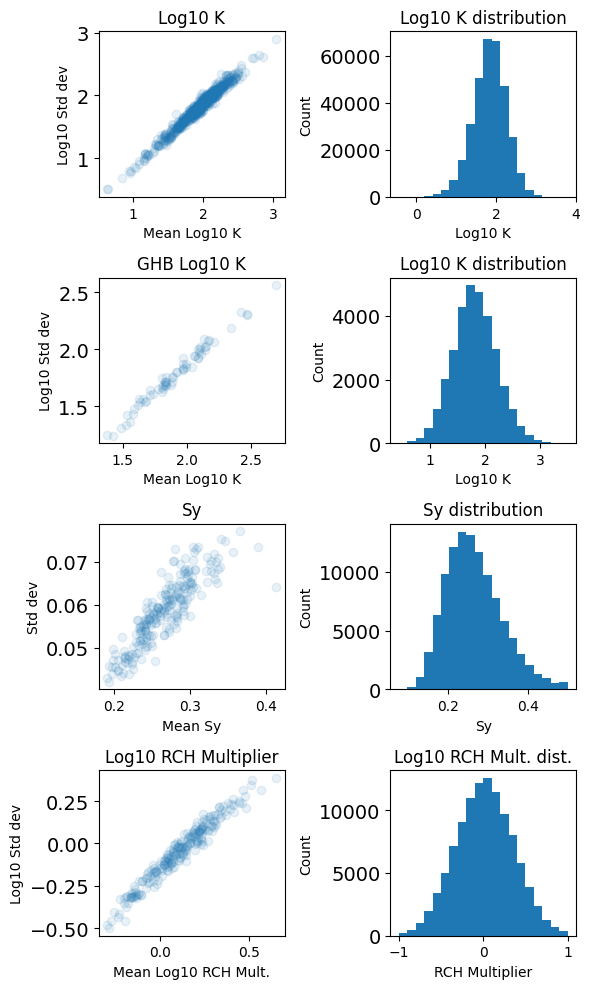

In [165]:
fig, axs = plt.subplots(4, 2, dpi=100, figsize=(6, 10))
axs[0, 0].scatter(np.log10(khpp_mean), np.log10(khpp_std), alpha=0.1)
axs[0, 0].set_title('Log10 K')
axs[0, 0].set(xlabel='Mean Log10 K', ylabel='Log10 Std dev')
axs[0, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('khpp')].values.flatten()), bins=20)
axs[0, 1].set_title('Log10 K distribution')
axs[0, 1].set(xlabel='Log10 K', ylabel='Count')

axs[1, 0].scatter(np.log10(ghbpp_mean), np.log10(ghbpp_std), alpha=0.1)
axs[1, 0].set_title('GHB Log10 K')
axs[1, 0].set(xlabel='Mean Log10 K', ylabel='Log10 Std dev')
axs[1, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('ghbc')].values.flatten()), bins=20)
axs[1, 1].set_title('Log10 K distribution')
axs[1, 1].set(xlabel='Log10 K', ylabel='Count')

axs[2, 0].scatter(sypp_mean, sypp_std, alpha=0.1)
axs[2, 0].set_title('Sy')
axs[2, 0].set(xlabel='Mean Sy', ylabel='Std dev')
axs[2, 1].hist(param_pt.T.loc[param_pt.T.index.str.contains('sypp')].values.flatten(), bins=20)
axs[2, 1].set_title('Sy distribution')
axs[2, 1].set(xlabel='Sy', ylabel='Count')

axs[3, 0].scatter(np.log10(rchmulpp_mean), np.log10(rchmulpp_std), alpha=0.1)
axs[3, 0].set_title('Log10 RCH Multiplier')
axs[3, 0].set(xlabel='Mean Log10 RCH Mult.', ylabel='Log10 Std dev')
axs[3, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('rchmulpp')].values.flatten()), bins=20)
axs[3, 1].set_title('Log10 RCH Mult. dist.')
axs[3, 1].set(xlabel='RCH Multiplier', ylabel='Count')

plt.tight_layout()

In [166]:
#https://books.gw-project.org/hydrogeologic-properties-of-earth-materials-and-principles-of-groundwater-flow/chapter/specific-yield-and-specific-retention/
print(f'Sy min: {param_pt.T.loc[param_pt.T.index.str.contains("sypp")].values.flatten().min()}')
print(f'Sy max: {param_pt.T.loc[param_pt.T.index.str.contains("sypp")].values.flatten().max()}')
print(f'RCH Mult min: {param_pt.T.loc[param_pt.T.index.str.contains("rchmulpp")].values.flatten().min()}')
print(f'RCH Mult max: {param_pt.T.loc[param_pt.T.index.str.contains("rchmulpp")].values.flatten().max()}')

Sy min: 0.077578343
Sy max: 0.5
RCH Mult min: 0.1
RCH Mult max: 10.0


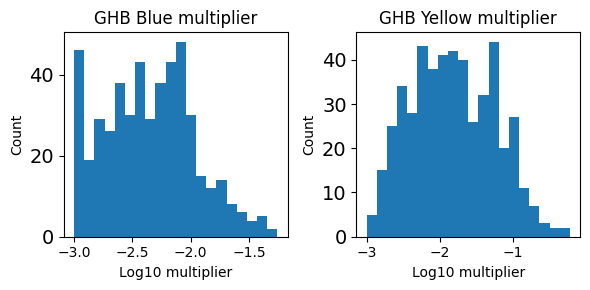

In [168]:
#### GHB Multiplier
fig, axs = plt.subplots(1, 2, dpi=100, figsize=(6, 3))
axs[0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('ghbbluemult')].values.flatten()), bins=20)
axs[0].set_title('GHB Blue multiplier')
axs[0].set(xlabel='Log10 multiplier', ylabel='Count')
axs[1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('ghbyellomult')].values.flatten()), bins=20)
axs[1].set_title('GHB Yellow multiplier')
axs[1].set(xlabel='Log10 multiplier', ylabel='Count')

plt.tight_layout()

In [169]:
print(f'GHB Blue multiplier min: {param_pt.T.loc[param_pt.T.index.str.contains("ghbbluemult")].values.flatten().min()}')
print(f'GHB Blue multiplier max: {param_pt.T.loc[param_pt.T.index.str.contains("ghbbluemult")].values.flatten().max()}\n')

print(f'GHB Yellow multiplier min: {param_pt.T.loc[param_pt.T.index.str.contains("ghbyellomult")].values.flatten().min()}')
print(f'GHB Yellow multiplier max: {param_pt.T.loc[param_pt.T.index.str.contains("ghbyellomult")].values.flatten().max()}\n')

GHB Blue multiplier min: 0.001
GHB Blue multiplier max: 0.055492777

GHB Yellow multiplier min: 0.001
GHB Yellow multiplier max: 0.5971068



In [170]:
'''
OLD VALUES:
GHB Blue multiplier min: 0.001
GHB Blue multiplier max: 0.050049659

GHB Yellow multiplier min: 0.0010743999
GHB Yellow multiplier max: 0.391535

New ranges:
ghbbluemult -> 0.001 to 1.0 #0.001
ghbyellomult -> 0.001 to 1.0
'''

'\nOLD VALUES:\nGHB Blue multiplier min: 0.001\nGHB Blue multiplier max: 0.050049659\n\nGHB Yellow multiplier min: 0.0010743999\nGHB Yellow multiplier max: 0.391535\n\nNew ranges:\nghbbluemult -> 0.001 to 1.0 #0.001\nghbyellomult -> 0.001 to 1.0\n'

In [171]:
#### SFR
# SFR Hydraulic conductivity
sfrpprhk_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprhk')].T.mean()
sfrpprhk_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprhk')].T.std()

# SFR reach width
sfrpprwid_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprwid')].T.mean()
sfrpprwid_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprwid')].T.std()

# Bottom thickness
sfrpprbth_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprbth')].T.mean()
sfrpprbth_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprbth')].T.std()

# Reach gradient
sfrpprgrd_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprgrd')].T.mean()
sfrpprgrd_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrpprgrd')].T.std()

# Manning coefficient
sfrppman_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrppman')].T.mean()
sfrppman_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrppman')].T.std()

# SFR upstream inflow
sfrinf_mean = param_pt.T.loc[param_pt.T.index.str.contains('sfrinf')].T.mean()
sfrinf_std = param_pt.T.loc[param_pt.T.index.str.contains('sfrinf')].T.std()

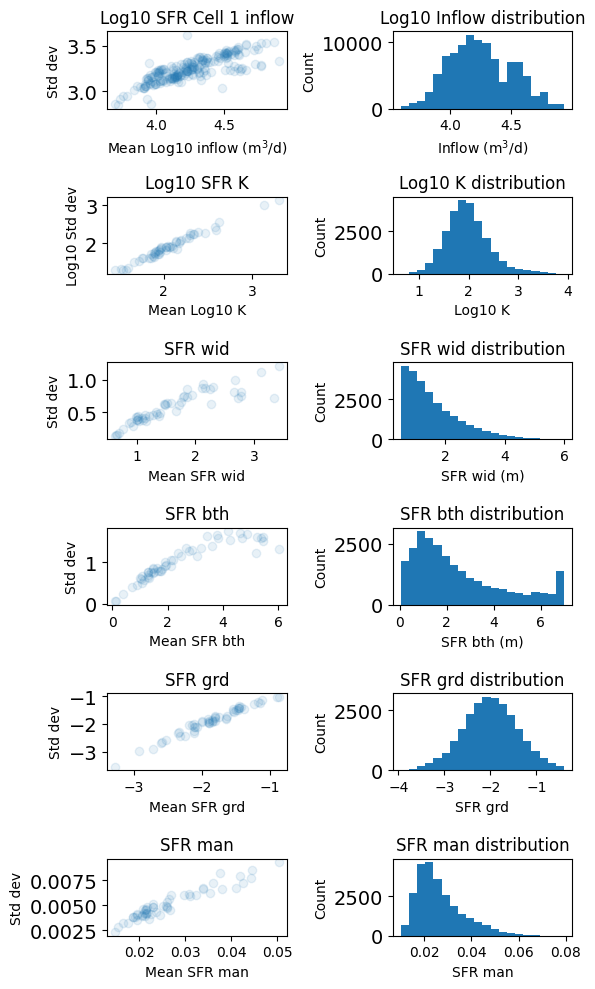

In [172]:
fig, axs = plt.subplots(6, 2, dpi=100, figsize=(6, 10))
axs[0, 0].scatter(np.log10(sfrinf_mean), np.log10(sfrinf_std), alpha=0.1)
axs[0, 0].set_title('Log10 SFR Cell 1 inflow')
axs[0, 0].set(xlabel='Mean Log10 inflow (m$^3$/d)', ylabel='Std dev')
axs[0, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('sfrinf')].values.flatten()), bins=20)
axs[0, 1].set_title('Log10 Inflow distribution')
axs[0, 1].set(xlabel='Inflow (m$^3$/d)', ylabel='Count')

axs[1, 0].scatter(np.log10(sfrpprhk_mean), np.log10(sfrpprhk_std), alpha=0.1)
axs[1, 0].set_title('Log10 SFR K')
axs[1, 0].set(xlabel='Mean Log10 K', ylabel='Log10 Std dev')
axs[1, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('sfrpprhk')].values.flatten()), bins=20)
axs[1, 1].set_title('Log10 K distribution')
axs[1, 1].set(xlabel='Log10 K', ylabel='Count')

axs[2, 0].scatter(sfrpprwid_mean, sfrpprwid_std, alpha=0.1)
axs[2, 0].set_title('SFR wid')
axs[2, 0].set(xlabel='Mean SFR wid', ylabel='Std dev')
axs[2, 1].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrpprwid')].values.flatten(), bins=20)
axs[2, 1].set_title('SFR wid distribution')
axs[2, 1].set(xlabel='SFR wid (m)', ylabel='Count')

axs[3, 0].scatter(sfrpprbth_mean, sfrpprbth_std, alpha=0.1)
axs[3, 0].set_title('SFR bth')
axs[3, 0].set(xlabel='Mean SFR bth', ylabel='Std dev')
axs[3, 1].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrpprbth')].values.flatten(), bins=20)
axs[3, 1].set_title('SFR bth distribution')
axs[3, 1].set(xlabel='SFR bth (m)', ylabel='Count')

axs[4, 0].scatter(np.log10(sfrpprgrd_mean), np.log10(sfrpprgrd_std), alpha=0.1)
axs[4, 0].set_title('SFR grd')
axs[4, 0].set(xlabel='Mean SFR grd', ylabel='Std dev')
axs[4, 1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('sfrpprgrd')].values.flatten()), bins=20)
axs[4, 1].set_title('SFR grd distribution')
axs[4, 1].set(xlabel='SFR grd', ylabel='Count')

axs[5, 0].scatter(sfrppman_mean, sfrppman_std, alpha=0.1)
axs[5, 0].set_title('SFR man')
axs[5, 0].set(xlabel='Mean SFR man', ylabel='Std dev')
axs[5, 1].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrppman')].values.flatten(), bins=20)
axs[5, 1].set_title('SFR man distribution')
axs[5, 1].set(xlabel='SFR man', ylabel='Count')

plt.tight_layout()

In [173]:
print(f'SFR Inflow min: {param_pt.T.loc[param_pt.T.index.str.contains("sfrinf")].values.flatten().min()}')
print(f'SFR Inflow max: {param_pt.T.loc[param_pt.T.index.str.contains("sfrinf")].values.flatten().max()}\n')

print(f'SFR wid min: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprwid")].values.flatten().min()}')
print(f'SFR wid max: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprwid")].values.flatten().max()}\n')

print(f'SFR bth min: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprbth")].values.flatten().min()}')
print(f'SFR bth max: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprbth")].values.flatten().max()}\n')

print(f'SFR grd min: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprgrd")].values.flatten().min()}')
print(f'SFR grd max: {param_pt.T.loc[param_pt.T.index.str.contains("sfrpprgrd")].values.flatten().max()}\n')

print(f'SFR man min: {param_pt.T.loc[param_pt.T.index.str.contains("sfrppman")].values.flatten().min()}')
print(f'SFR man max: {param_pt.T.loc[param_pt.T.index.str.contains("sfrppman")].values.flatten().max()}\n')

SFR Inflow min: 4000.0
SFR Inflow max: 84328.26

SFR wid min: 0.5
SFR wid max: 6.0

SFR bth min: 0.050000001
SFR bth max: 7.0

SFR grd min: 0.00011211719
SFR grd max: 0.4

SFR man min: 0.010004839
SFR man max: 0.079279572



In [174]:
'''
OLD VALUES:
SFR Inflow min: 4000.0
SFR Inflow max: 82848.59

SFR wid min: 0.5
SFR wid max: 6.0

SFR bth min: 0.050000001
SFR bth max: 6.0

SFR grd min: 0.00050000002
SFR grd max: 0.3

SFR man min: 0.015
SFR man max: 0.039999999

---

New SFR inflow range -> 2000 to 100000
New SFR wid range -> 0.3 to 10.0
New SFR bth range -> 0.05 to 7.0 # Fungerar, dock -> # 0.01 to 10.0 Detta gick inte för sig!
New SFR grd range -> 0.0001 to 0.4 # Verkar också gå fint
New SFR man range -> 0.01 to 0.16 # Detta funkar fint!
'''

'\nOLD VALUES:\nSFR Inflow min: 4000.0\nSFR Inflow max: 82848.59\n\nSFR wid min: 0.5\nSFR wid max: 6.0\n\nSFR bth min: 0.050000001\nSFR bth max: 6.0\n\nSFR grd min: 0.00050000002\nSFR grd max: 0.3\n\nSFR man min: 0.015\nSFR man max: 0.039999999\n\n---\n\nNew SFR inflow range -> 2000 to 100000\nNew SFR wid range -> 0.3 to 10.0\nNew SFR bth range -> 0.05 to 7.0 # Fungerar, dock -> # 0.01 to 10.0 Detta gick inte för sig!\nNew SFR grd range -> 0.0001 to 0.4 # Verkar också gå fint\nNew SFR man range -> 0.01 to 0.16 # Detta funkar fint!\n'

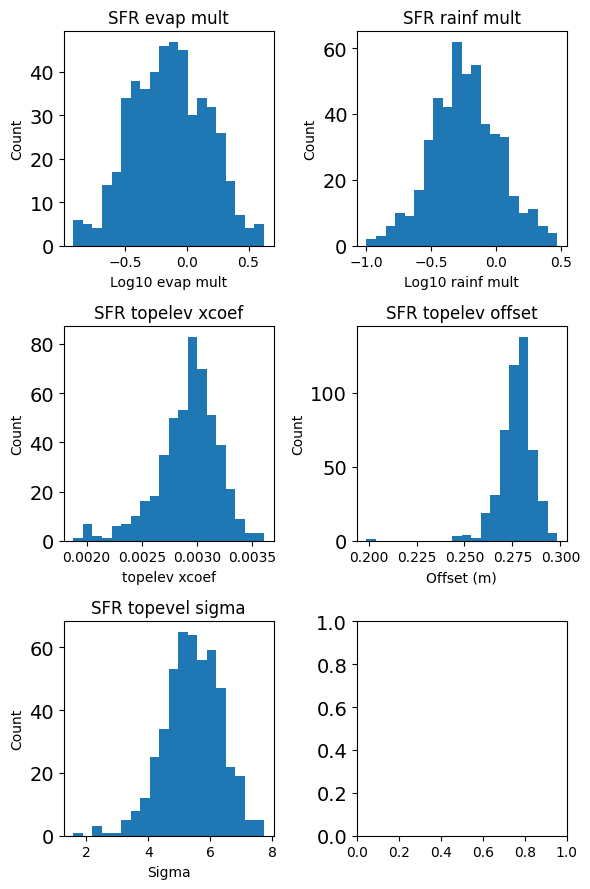

In [175]:
#### SFR other
fig, axs = plt.subplots(3, 2, dpi=100, figsize=(6, 9))
axs[0,0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('sfr_ev_mul')].values.flatten()), bins=20)
axs[0,0].set_title('SFR evap mult')
axs[0,0].set(xlabel='Log10 evap mult', ylabel='Count')
axs[0,1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('sfr_rf_mul')].values.flatten()), bins=20)
axs[0,1].set_title('SFR rainf mult')
axs[0,1].set(xlabel='Log10 rainf mult', ylabel='Count')
axs[1,0].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrrtpexcoef')].values.flatten(), bins=20)
axs[1,0].set_title('SFR topelev xcoef')
axs[1,0].set(xlabel='topelev xcoef', ylabel='Count')
axs[1,1].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrrtpoffset')].values.flatten(), bins=20)
axs[1,1].set_title('SFR topelev offset')
axs[1,1].set(xlabel='Offset (m)', ylabel='Count')
axs[2,0].hist(param_pt.T.loc[param_pt.T.index.str.contains('sfrrtpsigma')].values.flatten(), bins=20)
axs[2,0].set_title('SFR topevel sigma')
axs[2,0].set(xlabel='Sigma', ylabel='Count')

plt.tight_layout()

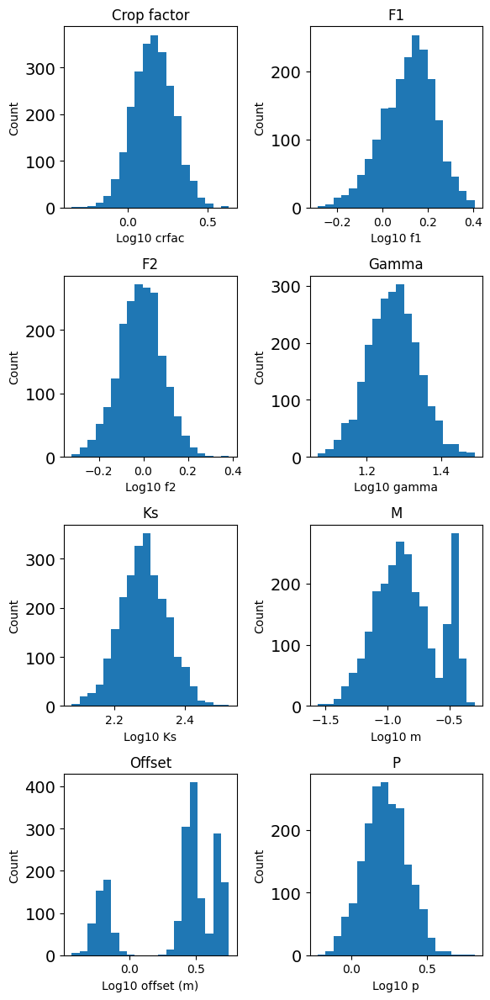

In [176]:
#### LUMPREM
fig, axs = plt.subplots(4, 2, dpi=100, figsize=(6, 12))
axs[0,0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('crfac')].values.flatten()), bins=20)
axs[0,0].set_title('Crop factor')
axs[0,0].set(xlabel='Log10 crfac', ylabel='Count')
axs[0,1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('f1_')].values.flatten()), bins=20)
axs[0,1].set_title('F1')
axs[0,1].set(xlabel='Log10 f1', ylabel='Count')
axs[1,0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('f2_')].values.flatten()), bins=20)
axs[1,0].set_title('F2')
axs[1,0].set(xlabel='Log10 f2', ylabel='Count')
axs[1,1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('gamma_')].values.flatten()), bins=20)
axs[1,1].set_title('Gamma')
axs[1,1].set(xlabel='Log10 gamma', ylabel='Count')
axs[2,0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('ks_')].values.flatten()), bins=20)
axs[2,0].set_title('Ks')
axs[2,0].set(xlabel='Log10 Ks', ylabel='Count')
axs[2,1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('m_')].values.flatten()), bins=20)
axs[2,1].set_title('M')
axs[2,1].set(xlabel='Log10 m', ylabel='Count')
axs[3,0].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('of_')].values.flatten()), bins=20)
axs[3,0].set_title('Offset')
axs[3,0].set(xlabel='Log10 offset (m)', ylabel='Count')
axs[3,1].hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('p_')].values.flatten()), bins=20)
axs[3,1].set_title('P')
axs[3,1].set(xlabel='Log10 p', ylabel='Count')

plt.tight_layout()

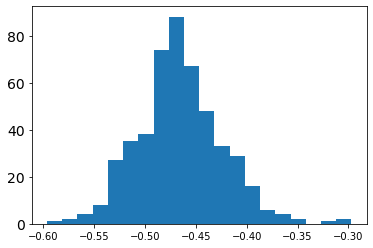

In [177]:
plt.hist(np.log10(param_pt.T.loc[param_pt.T.index.str.contains('m_lu1')].values.flatten()), bins=20)
plt.show()